In [ ]:
#conda install pytorch torchvision torchaudio pytorch-cuda=11.6 -c pytorch -c nvidia

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install patchify 
!pip install GPUtil
#!pip install torchgeo
#!pip install rasterio
!pip install gdal
#!pip install torch-rs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for GPUtil: filename=GPUtil-1.4.0-py3-none-any.whl size=7409 sha256=f74287836691bd0c0f83b6af112cdf7af3ad211255305064fce5c36f49b54825
  Stored in directory: /root/.cache/pip/wheels/ba/03/bb/7a97840eb54479b328672e15a536e49dc60da200fb21564d53
Successfully built GPUtil
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
!pip install pyproj

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 57.2 MB/s eta 0:00:00


In [4]:
!pip install torcheval
!pip install segmentation-models-pytorch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.4/158.4 KB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.6/83.6 KB 11.4 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 KB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 KB 7.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 549.1/549.1 KB 15.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.3/190.3 KB 24.5 MB/s eta 0:00:00
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16446 sha256=00f86a831a809aa3c73772d5a669208ec28d176d02f9436e748f75892edcbcba
  Stored in directory: /root/.cache/pip/wheels/84/b9/90/2

In [5]:
!pip install torchmetrics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 518.6/518.6 KB 8.9 MB/s eta 0:00:00


In [6]:
import torch
import torch.nn.functional as F
import torchvision.transforms.functional as TF
from pathlib import Path
from torch.utils.data import Dataset, DataLoader, sampler
import pandas as pd
from torchvision import transforms

from tqdm import tqdm
from timeit import default_timer as timer 
from PIL import Image

import numpy as np
from patchify import patchify, unpatchify
import gc
import os
import pdb
import warnings
import cv2
import pywt
import os
import matplotlib.pyplot as plt
#from ND_Crossentropy import CrossentropyND, TopKLoss, WeightedCrossEntropyLoss
from torch import nn
from torch.autograd import Variable
from torch import einsum
from IPython.display import clear_output
from sklearn.metrics import jaccard_score
from torcheval.metrics.functional import multiclass_f1_score
from copy import deepcopy
#from sklearn.metrics import accuracy_score, f1_score
import albumentations as A
import random
from scipy.interpolate import RectBivariateSpline
#import pyproj
import segmentation_models_pytorch as smp
from segmentation_models_pytorch import utils
from segmentation_models_pytorch.encoders import get_preprocessing_fn
import torch.optim as optim
from itertools import chain

%matplotlib inline
warnings.filterwarnings("ignore")
torch.version.cuda,np.version.version

('11.6', '1.22.4')

In [7]:
np.set_printoptions(threshold=1e7)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
device

device(type='cuda')

**USE RASTERIO or GDAL TO IPEN MULTISPECTRAL IMAGE**

In [8]:
from osgeo import gdal,osr, ogr

TRY TO GET LAT LON FROM GEOTIFF VIA GDAL

In [ ]:

classes= {
0:    'Shadow',
1:    'Shadow over Water',
2:    'Water',
3:    'Snow',
4:    'Land',
5:    'Cloud',
6:    'Flooded'
}
classes


{0: 'Shadow',
 1: 'Shadow over Water',
 2: 'Water',
 3: 'Snow',
 4: 'Land',
 5: 'Cloud',
 6: 'Flooded'}

In [ ]:

dataset_sample = gdal.Open('/content/drive/MyDrive/SPARCS/test/tiff/LC82151102013360LGN00_26.tif')
# Open the geotiff file
target_srs = gdal.osr.SpatialReference()
target_srs.ImportFromEPSG(4326)

# Reproject the geotiff to target SRS
reproj_name = '/content/drive/MyDrive/SPARCS/test/tiff/LC82151102013360LGN00_26_reprojected.tif'
gdal.Warp(reproj_name, dataset_sample, dstSRS=target_srs)
reprojected_dataset = gdal.Open(reproj_name)

# Get the geotransform
geotransform = reprojected_dataset.GetGeoTransform()

# Get the image dimensions
cols = reprojected_dataset.RasterXSize
rows = reprojected_dataset.RasterYSize

# Create arrays to hold the longitude and latitude values
lon_arr = np.zeros((rows, cols))
lat_arr = np.zeros((rows, cols))

# Generate arrays of pixel coordinates
x_coords, y_coords = np.meshgrid(np.arange(cols), np.arange(rows))
# Convert pixel coordinates to map coordinates
map_x = geotransform[0] + x_coords * geotransform[1] + y_coords * geotransform[2]
map_y = geotransform[3] + x_coords * geotransform[4] + y_coords * geotransform[5]

# Create a spatial reference object from the geotiff projection
source_srs = osr.SpatialReference()
source_srs.ImportFromWkt(reprojected_dataset.GetProjection())

# Create a transform object to convert from map coordinates to WGS84
transform = osr.CoordinateTransformation(source_srs, target_srs)

# Convert map coordinates to lon and lat
coords = np.column_stack((map_x.flatten(), map_y.flatten()))
lon_arr_flat, lat_arr_flat, _ = np.array(transform.TransformPoints(coords)).T
lon_arr = lon_arr_flat.reshape((rows, cols))
lat_arr = lat_arr_flat.reshape((rows, cols))

# Interpolate the arrays to size (1000, 1000)
spline_lon = RectBivariateSpline(np.arange(rows), np.arange(cols), lon_arr)
spline_lat = RectBivariateSpline(np.arange(rows), np.arange(cols), lat_arr)
lon_arr = spline_lon(np.linspace(0, rows-1, 1000), np.linspace(0, cols-1, 1000))
lat_arr = spline_lat(np.linspace(0, rows-1, 1000), np.linspace(0, cols-1, 1000))

# Print the results
print("Min Longitude:", np.min(lon_arr))
print("Max Longitude:", np.max(lon_arr))
print("Min Latitude:", np.min(lat_arr))
print("Max Latitude:", np.max(lat_arr))
print("lon_arr shape:", lon_arr.shape)
print("lat_arr shape:", lat_arr.shape)
print("raster array shape:", dataset_sample.GetRasterBand(1).ReadAsArray().shape)
#lon_arr.shape,lat_arr.shape,dataset_sample.GetRasterBand(1).ReadAsArray().shape

Min Longitude: -66.27960442769546
Max Longitude: -65.22539292386644
Min Latitude: -70.52927728784896
Max Latitude: -70.17472354435968
lon_arr shape: (1000, 1000)
lat_arr shape: (1000, 1000)
raster array shape: (1000, 1000)


**PREPARE CUSTOM DATASET FOR U-NET**

In [ ]:
#mean = [   0.19891909,   0.18813817,   0.19011587,  -70.352005,-65.75389   ]#SHOULD BE FIXED FOR LON sand LAT
#std = [0.06136227, 0.06468521, 0.07081716, 0.07747472, 0.23024175]#SHOULD BE FIXED FOR LON sand LAT
mean = [ 0.1989191,   0.18813817,  0.19011587, 21.68459,    13.082133  ]
std = [0.06136227, 0.06468521, 0.07081716, 0.10493134, 0.07946981]
#after normalizing lon and lat on [0...1]
mean = [ 0.1989191,   0.18813817,  0.19011587, 0,0  ]
std = [0.06136227, 0.06468521, 0.07081716, 1,1]
class Cloud_Snow_Dataset_SPARCS(Dataset):
    def __init__(self, tiff_dir, masks_dir, meta_dir, qmask_dir, rgb_dir, mode ='train', pytorch=True,mean = mean, std= std):
        super().__init__()
        
        # Loop through the files in red folder and combine, into a dictionary, the other bands
        self.files = [self.combine_files(f,masks_dir, meta_dir, qmask_dir, rgb_dir) for f in tiff_dir.iterdir() if not f.is_dir()]
        self.pytorch = pytorch
        self.mode = mode
        self.mean = mean
        self.std = std
        self.transforms = A.Compose([
        A.Resize(224, 224),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        #A.RandomBrightnessContrast(p=0.2),
        #A.RandomGamma(p=0.2),
        #A.Blur(p=0.1),
        A.Normalize(mean=self.mean, std=self.std, max_pixel_value=1.0),
    ])
    def combine_files(self, tiff_file: Path, masks_dir, meta_dir, qmask_dir, rgb_dir):
        files = {'tiff': tiff_file, 
                 'masks':masks_dir/tiff_file.name.replace('data', 'mask').replace('tif','png'),
                 'meta': meta_dir/tiff_file.name.replace('data', 'mtl').replace('tif','txt'), 
                 'qmask': qmask_dir/tiff_file.name.replace('data', 'qmask'),
                 'rgb': rgb_dir/tiff_file.name.replace('data', 'photo').replace('tif','png')}

        return files
                                       
    def __len__(self):
        
        return len(self.files)
    def open_meta(self,idx):
        d_names = (self.files[idx]['meta'].name)[-11:-7]
        meta_name = self.files[idx]['meta'].name.replace(d_names,'_')
        if self.mode =='train':meta_path = Path('/content/drive/MyDrive/SPARCS/train/meta/'+meta_name)
        else: meta_path = Path('/content/drive/MyDrive/SPARCS/test/meta/'+meta_name)
        
        #print((meta_name), type(meta_name))
        with open(meta_path, 'r') as file:
            meta_data = file.read().rstrip()
            return meta_data
     
    def open_rgb_array(self, idx, invert=False):
        raw_rgb = np.array(Image.open(self.files[idx]['rgb']))
        if invert:
            raw_rgb = raw_rgb.transpose((2,0,1))
        return (raw_rgb / np.iinfo(raw_rgb.dtype).max)

    def extract_lon_lat(self,idx):
        if self.mode =='train':tif_file_name = '/content/drive/MyDrive/SPARCS/train/tiff/'+self.files[idx]['tiff'].name
        else:tif_file_name = '/content/drive/MyDrive/SPARCS/test/tiff/'+self.files[idx]['tiff'].name
        dataset_sample = gdal.Open(tif_file_name)
        #####################################
        # Open the geotiff file
        target_srs = gdal.osr.SpatialReference()
        target_srs.ImportFromEPSG(4326)

        # Reproject the geotiff to target SRS
        reproj_name = '/content/drive/MyDrive/SPARCS/test/tiff/LC82151102013360LGN00_'+str(idx)+'_reprojected.tif'
        gdal.Warp(reproj_name, dataset_sample, dstSRS=target_srs)
        reprojected_dataset = gdal.Open(reproj_name)

        # Get the geotransform
        geotransform = reprojected_dataset.GetGeoTransform()

        # Get the image dimensions
        cols = reprojected_dataset.RasterXSize
        rows = reprojected_dataset.RasterYSize

        # Create arrays to hold the longitude and latitude values
        lon_arr = np.zeros((rows, cols))
        lat_arr = np.zeros((rows, cols))

        # Generate arrays of pixel coordinates
        x_coords, y_coords = np.meshgrid(np.arange(cols), np.arange(rows))
        # Convert pixel coordinates to map coordinates
        map_x = geotransform[0] + x_coords * geotransform[1] + y_coords * geotransform[2]
        map_y = geotransform[3] + x_coords * geotransform[4] + y_coords * geotransform[5]

        # Create a spatial reference object from the geotiff projection
        source_srs = osr.SpatialReference()
        source_srs.ImportFromWkt(reprojected_dataset.GetProjection())

        # Create a transform object to convert from map coordinates to WGS84
        transform = osr.CoordinateTransformation(source_srs, target_srs)

        # Convert map coordinates to lon and lat
        coords = np.column_stack((map_x.flatten(), map_y.flatten()))
        lon_arr_flat, lat_arr_flat, _ = np.array(transform.TransformPoints(coords)).T
        lon_arr = lon_arr_flat.reshape((rows, cols))
        lat_arr = lat_arr_flat.reshape((rows, cols))
        # Interpolate the arrays to size (1000, 1000)
        spline_lon = RectBivariateSpline(np.arange(rows), np.arange(cols), lon_arr)
        spline_lat = RectBivariateSpline(np.arange(rows), np.arange(cols), lat_arr)
        lon_arr = spline_lon(np.linspace(0, rows-1, 1000), np.linspace(0, cols-1, 1000))
        lat_arr = spline_lat(np.linspace(0, rows-1, 1000), np.linspace(0, cols-1, 1000))
        return (lon_arr+180.0)/360.0,(lat_arr+90.0)/180.0

    def extract_bands(self,idx):
        if self.mode =='train':tif_file_name = '/content/drive/MyDrive/SPARCS/train/tiff/'+self.files[idx]['tiff'].name
        else:tif_file_name = '/content/drive/MyDrive/SPARCS/test/tiff/'+self.files[idx]['tiff'].name
        #print('file_name is:',tif_file_name)
        tif_file = gdal.Open(tif_file_name)
        all_bands = np.array([tif_file.GetRasterBand(i).ReadAsArray() for i in range(1,tif_file.RasterCount)])
        #print('max value =',np.iinfo(merged_3_bands.dtype).max)
        bands_4 = all_bands[0:4]
        merged_3bands = np.array([bands_4[0]/2+bands_4[1]/2,bands_4[2],bands_4[3]])
        return merged_3bands/np.iinfo(all_bands.dtype).max #merged_3_bands.astype('uint8')#(merged_3_bands / np.iinfo(merged_3_bands.dtype).max).astype('uint8')# merged_3_bands

    def open_mask(self, idx, add_dims=False):#,mask_file_name):
        mask_file_name= self.files[idx]['masks']
        if self.mode =='train':mask_file_name = '/content/drive/MyDrive/SPARCS/train/masks/'+self.files[idx]['masks'].name
        else:mask_file_name = '/content/drive/MyDrive/SPARCS/test/masks/'+self.files[idx]['masks'].name
        mask_file = np.asarray(Image.open(mask_file_name))#.read()
        H,W = mask_file.shape#[1:]
        cloud_mask, snow_mask,bg_mask = mask_file.copy(), mask_file.copy(), np.zeros(mask_file.shape).astype(int)#,np.zeros( mask.shape),np.zeros( mask.shape)
        cloud_mask[cloud_mask!=5] = 0 #np.array(mask == 5)
        cloud_mask = cloud_mask//2 # get  1
        snow_mask[snow_mask!=3] = 0 #np.array(mask == 3)
        snow_mask=snow_mask//2 # get  1
        rgb_masks = (np.array([cloud_mask.reshape(mask_file.shape), snow_mask.reshape(mask_file.shape),bg_mask]))
        #print(np.max(rgb_masks))
        return rgb_masks#.transpose(1,2,0) #/ np.finfo(rgb_masks.dtype).max

    
    def __getitem__(self, idx):
        #transformed = self.transform(image=image, mask=mask)
        x_tif = torch.tensor(self.extract_bands(idx), dtype=torch.float32).permute(1,2,0)
        lon, lat = self.extract_lon_lat(idx)
        lon, lat = torch.tensor(lon, dtype=torch.float32).unsqueeze(0).permute(1,2,0),torch.tensor(lat, dtype=torch.float32).unsqueeze(0).permute(1,2,0)
        x_tif_lonlat = torch.cat([x_tif,lon,lat], dim =2).permute(2,0,1)
        x_rgb = torch.tensor(self.open_rgb_array(idx, invert=self.pytorch), dtype=torch.float32)
        y_ohe = torch.tensor(self.label_mask(idx, add_dims=False), dtype=torch.float32)#.permute(1,2,0)
        y_squeezed = y_ohe[0,:,:]+y_ohe[1,:,:]+y_ohe[2,:,:]
        #print('unick values of mask:',y_squeezed.unique(return_counts=True))
        meta = self.open_meta(idx)
        x_tif_lonlat_np, y_squeezed_np = x_tif_lonlat.numpy().transpose(1,2,0), y_squeezed.numpy()
        #print('shapes of x_tif_lonlat_np, y_squeezed_np',x_tif_lonlat_np.shape, y_squeezed_np.shape)
        #if self.transform != None:
        #augmented = self.aug(image=x_tif_lonlat_np, mask=y_squeezed_np)#self.aug['image'](x_tif_lonlat,y_ohe,y_squeezed)#.permute(1,2,0)
        # Apply augmentation pipeline to the image and the mask
        augmented = self.transforms(image=x_tif_lonlat_np, mask=y_squeezed_np)#, lon_arr=lon_arr, lat_arr=lat_arr)
        x_tif_lonlat, y_squeezed = augmented['image'],augmented['mask']
        x_tif_lonlat, y_squeezed = torch.tensor(x_tif_lonlat).permute(2,0,1), torch.tensor(y_squeezed)
        #print('unick values of mask:',y_squeezed.unique(return_counts=True)) 
        return x_tif_lonlat,x_rgb, y_ohe,y_squeezed,meta#,lon_lat
    
    def open_mask_as_pil(self, idx):
        max_mask_pix = 1
        arr = 255//max_mask_pix*self.open_mask(idx).transpose(1,2,0)
        #print(np.min(arr),np.max(arr))
        
        return Image.fromarray(arr.astype(np.uint8), 'RGB')
    def label_mask(self, idx, add_dims=False):
        mask_file_name= self.files[idx]['masks']
        if self.mode =='train':mask_file_name = '/content/drive/MyDrive/SPARCS/train/masks/'+self.files[idx]['masks'].name
        else:mask_file_name = '/content/drive/MyDrive/SPARCS/test/masks/'+self.files[idx]['masks'].name
        mask_file = np.asarray(Image.open(mask_file_name))#.read()
        #all_masks = np.array([mask_file.GetRasterBand(i).ReadAsArray() for i in range(1,4)])
        #print(mask_file.shape)
        H,W = mask_file.shape#[1:]
        cloud_mask, snow_mask,bg_mask = mask_file.copy(), mask_file.copy(), np.zeros(mask_file.shape)#,np.zeros( mask.shape),np.zeros( mask.shape)
        cloud_mask[cloud_mask!=5] = 0 #np.array(mask == 5)
        cloud_mask = cloud_mask//2
        snow_mask[snow_mask!=3] = 0 #np.array(mask == 3)
        snow_mask=snow_mask//2
        label_mask= (np.array([cloud_mask.reshape(mask_file.shape), snow_mask.reshape(mask_file.shape),bg_mask]))
        return label_mask
    def __repr__(self):
        s = 'Dataset class with {} files'.format(self.__len__())

        return s

In [ ]:
base_dir_train = Path('/content/drive/MyDrive/SPARCS/train')
base_dir_test = Path('/content/drive/MyDrive/SPARCS/test')
tiff_dir = Path('/content/drive/MyDrive/SPARCS/train/tiff')#base_path/'tiff'
masks_dir = Path('/content/drive/MyDrive/SPARCS/train/masks')#base_path/'masks'
qmask_dir = Path('/content/drive/MyDrive/SPARCS/train/qmask')#base_path/'qmask'
rgb_dir = Path('/content/drive/MyDrive/SPARCS/train/rgb')#base_path/'rgb'
meta_dir = Path('/content/drive/MyDrive/SPARCS/train/meta')#base_path/'meta'
#print(base_dir,tiff_dir,masks_dir,qmask_dir,rgb_dir,meta_dir)
SPARCS_data = Cloud_Snow_Dataset_SPARCS(tiff_dir, masks_dir, meta_dir, qmask_dir, rgb_dir)#,transform = base_transform)
print(len(SPARCS_data))


80


In [ ]:
#CALCULATING MEAN AND STD FOR SPARCS DATASET
# ATTENTION!!!! WORKS SEVERAL MINUTES ~ 10 MIN
means = []
stds = []
#IT SEEMS LIKE THE SAME GEOCOORDS ARE DERIVED FROM EACH PIC !? MUST BE FIXED!!!!
for x_tif,x_rgb, y,y_sq,mtl in SPARCS_data:
    # Assuming the last dimension represents the spectral channels
    channel_means = torch.mean(x_tif, dim=(1,2))
    channel_stds = torch.std(x_tif, dim=(1,2))
    print("mean, std for sample:",channel_means,channel_stds)
    means.append(channel_means.numpy())
    stds.append(channel_stds.numpy())

mean = np.mean(means, axis=0)
std = np.mean(stds, axis=0)
print('mean are:',mean)
print('std are:',std)

mean, std for sample: tensor([-5.6143e-01, -4.8862e-01, -3.0668e-01, -8.8855e+02, -5.4819e+02]) tensor([0.2276, 0.2676, 0.3417, 0.8782, 1.0050])
mean, std for sample: tensor([   5.4874,    4.8948,    4.3270, -676.2860,  636.9732]) tensor([0.9907, 0.9808, 0.9556, 1.7147, 1.0038])
mean, std for sample: tensor([-1.1870e-01, -2.5070e-01, -4.5965e-01, -8.4666e+02, -1.9363e+02]) tensor([1.5912, 1.6006, 1.6113, 0.7426, 0.9864])
mean, std for sample: tensor([ 2.6074e-01,  1.3554e-01,  7.8757e-02, -9.0135e+02,  4.8767e+02]) tensor([1.5396, 1.5324, 1.5169, 1.2322, 1.0072])
mean, std for sample: tensor([-5.3297e-01, -5.7884e-01, -5.5249e-01, -8.6724e+02, -8.7774e+01]) tensor([0.3977, 0.4283, 0.4670, 0.7462, 0.9863])
mean, std for sample: tensor([    1.1322,     1.0534,     1.0524, -1004.5483,   290.3838]) tensor([2.3272, 2.2662, 2.2144, 0.9421, 1.0087])
mean, std for sample: tensor([-7.7653e-01, -8.3368e-01, -1.0353e+00, -1.0553e+03,  8.2755e+01]) tensor([0.3831, 0.3951, 0.4162, 0.7961, 0.9964])


KeyboardInterrupt: ignored

(torch.Size([5, 224, 224]),
 torch.Size([3, 1000, 1000]),
 torch.Size([224, 224]))

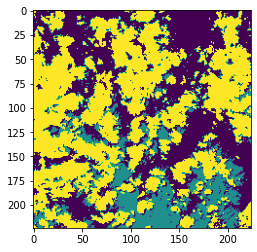

In [ ]:
from PIL import Image
SAMPLE_INDX = 42
#x_tif, y = SPARCS_data[SAMPLE_INDX]
x_tif,x_rgb, y,y_sq,mtl = SPARCS_data[SAMPLE_INDX]
plt.imshow(y_sq)#.transpose(1,2,0))
x_tif.shape ,y.shape,y_sq.shape#,x_tif[4] #,lon_lat.shape

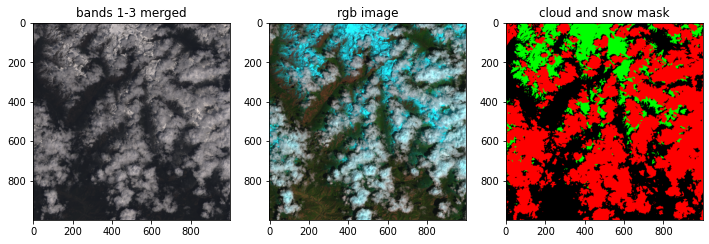

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
fig, ax = plt.subplots(1,3, figsize=(12,9))
rgb = SPARCS_data.extract_bands(SAMPLE_INDX)[0:3]#.transpose(1,2,0)
reversed_rgb = np.array([rgb[2],rgb[1],rgb[0]]).transpose(1,2,0)*255
reversed_rgb=reversed_rgb.astype(np.uint8)
ax[0].imshow(reversed_rgb)
ax[0].set_title('bands 1-3 merged')
ax[1].imshow(SPARCS_data.open_rgb_array(SAMPLE_INDX))
ax[1].set_title('rgb image')
ax[2].imshow(SPARCS_data.open_mask_as_pil(SAMPLE_INDX))
ax[2].set_title('cloud and snow mask')
#plt.legend()
plt.show()

In [ ]:
train_ds, valid_ds = torch.utils.data.random_split(SPARCS_data, (70, 10))
batch_size = 10#10
train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
valid_dl = DataLoader(valid_ds, batch_size=batch_size, shuffle=True)
# xb,x_rgb, yb,meta = next(iter(train_dl))
# xb.shape, yb.shape

In [ ]:
class_frequencies = torch.tensor([75, 5, 20], dtype=torch.float)

# class weights for Dice Loss
class_weights = 1 / torch.sqrt(class_frequencies)
class_weights /= torch.sum(class_weights)  # normalize weights to sum to 1
class_weights

tensor([0.1469, 0.5688, 0.2844])

In [ ]:
#ChatGPT DiceFocalLoss
import torch
import torch.nn.functional as F

class DiceFocalLoss(torch.nn.Module):
    def __init__(self, alpha=None, gamma=2, reduction='mean', weight_dice=[0.1469, 0.5688, 0.2844], weight_focal=[0.1469, 0.5688, 0.2844]):
        super(DiceFocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction
        self.weight_dice = weight_dice
        self.weight_focal = weight_focal

    def forward(self, inputs, targets):
        # Convert 2D target labels to one-hot encoding
        targets = F.one_hot(targets.long(), num_classes=3).permute(0, 3, 1, 2).float()

        # Move inputs and targets to GPU if available
        if inputs.device.type == 'cuda':
            targets = targets.cuda()
        
        # Compute Dice Loss
        smooth = 1e-5
        num_classes = inputs.size(1)
        dice_loss = 0
        for c in range(num_classes):
            intersection = torch.sum(inputs[:, c, :, :] * targets[:, c, :, :])
            cardinality = torch.sum(inputs[:, c, :, :] + targets[:, c, :, :])
            dice_loss += 2.0 * intersection / (cardinality + smooth)
        dice_loss = 1 - dice_loss / num_classes

        # Compute Focal Loss
        focal_weights = None
        if self.alpha is not None:
            targets = targets.float()
            focal_weights = (1 - targets) * self.alpha.unsqueeze(0).unsqueeze(-1).unsqueeze(-1) + targets * (1 - self.alpha.unsqueeze(0).unsqueeze(-1).unsqueeze(-1))
            focal_weights = focal_weights.pow(self.gamma)
            if inputs.device.type == 'cuda':
                focal_weights = focal_weights.cuda()

        focal_loss = F.binary_cross_entropy_with_logits(inputs, targets, weight=focal_weights, reduction=self.reduction)

        # Combine Dice Loss and Focal Loss
        weight_dice = torch.Tensor(self.weight_dice).to(inputs.device)
        weight_focal = torch.Tensor(self.weight_focal).to(inputs.device)
        loss = torch.mean(weight_dice * dice_loss + weight_focal * focal_loss)
        return loss

DEBUGGIG MY CUSTOM LOSS



In [ ]:
def iou_score(output, target, mode='multiclass',num_classes  =3):
  output = torch.functional.F.softmax(output, 1)
  output = torch.argmax(output, dim=1)
  tp, fp, fn, tn = smp.metrics.get_stats(output, target, mode='multiclass',num_classes  =3)
  iou_score = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")
  return iou_score
def prec_rec_f1_score(output, target, mode='multiclass',num_classes  =3):
  output = torch.functional.F.softmax(output, 1)
  output = torch.argmax(output, dim=1)
  tp, fp, fn, tn = smp.metrics.get_stats(output, target, mode='multiclass',num_classes  =3)
  prec = tp/(tp+fp)
  rec = tp/(tp+fn)
  f1 =2*prec*rec/(prec+rec) 
  return prec, rec, f1
dice =smp.losses.DiceLoss(mode= 'multiclass')
fl=smp.losses.FocalLoss(mode= 'multiclass', gamma =4)
y_pred = (torch.randn(5,3,256,256)-0.5)*2
y_gt = torch.randint(0,2,(5,256,256))
print('dice',dice.forward(y_pred, y_gt))
print('fl',fl.forward(y_pred, y_gt))
print("iou_score",iou_score(y_pred, y_gt))
#print('input,target',y_pred.shape,y_gt.shape)
my_loss = DiceFocalLoss()#(alpha=torch.tensor([0.75, 0.20, 0.05]), gamma=2, weight_dice=0.5, weight_focal=0.5)
print('my_loss',my_loss(y_pred,y_gt))
#print('prec_rec_f1_score',prec_rec_f1_score(y_pred,y_gt))

dice tensor(0.3991)
fl tensor(1.5511)
iou_score tensor(0.2006)
my_loss tensor(0.2128)


In [ ]:
target = torch.rand([10, 256, 256]).round().long()

output = torch.rand([10, 3, 256, 256])  
output = torch.argmax(output, dim=1)  # convert with argmax to shape of target

# first compute statistics for true positives, false positives, false negative and
# true negative "pixels"
tp, fp, fn, tn = smp.metrics.get_stats(output, target, mode='multiclass',num_classes  =3)

# compute metric
iou_score = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")
print(iou_score)
def iou_score(output, target, mode='multiclass',num_classes  =3):
  output = torch.functional.F.softmax(output, 1)
  output = torch.argmax(output, dim=1)
  tp, fp, fn, tn = smp.metrics.get_stats(output, target, mode='multiclass',num_classes  =3)
  iou_score = smp.metrics.iou_score(tp, fp, fn, tn, reduction="micro")
  return iou_score

tensor(0.1998)


In [ ]:

import GPUtil as GPU
import psutil
import gc
gc.collect()
def gpu_usage():
    GPUs = GPU.getGPUs()
    # XXX: only one GPU on Colab and isn’t guaranteed
    if len(GPUs) == 0:
        return False
    gpu = GPUs[0]
    process = psutil.Process(os.getpid())
    print(f"GPU RAM Free: {gpu.memoryFree:.0f}MB \
    | Used: {gpu.memoryUsed:.0f}MB \
    | Util {gpu.memoryUtil*100:3.0f}% \
    | Total {gpu.memoryTotal:.0f}MB")
print(f'CUDA allocated memory: {torch.cuda.memory_allocated()} bytes')
print(f'CUDA reserved memory: {torch.cuda.memory_reserved()} bytes')
x,y = None,None # del input 
outputs = None # del out
model = None
unet = None # del model
gc.collect()
torch.cuda.empty_cache() #clean cache
gpu_usage()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
CUDA allocated memory: 0 bytes
CUDA reserved memory: 0 bytes
GPU RAM Free: 40533MB     | Used: 3MB     | Util   0%     | Total 40960MB


In [ ]:
# Initiate UNet++ Model ======================================
#from torchmetrics.classification import MulticlassHingeLoss

MULTICLASS_MODE: str = "multiclass"
ENCODER_WEIGHTS = 'imagenet'
CLASSES = ['background', 'snow', 'cloud']
ACTIVATION = 'softmax'
DEVICE = 'cuda'
device = 'cuda'
model = smp.UnetPlusPlus(
    encoder_name='efficientnet-b2', #maybe use efficientnet-b7, but its heavier
    encoder_weights='imagenet', 
    in_channels=5,
    classes=3,)
    #activation = ACTIVATION)



Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b2-8bb594d6.pth" to /root/.cache/torch/hub/checkpoints/efficientnet-b2-8bb594d6.pth


  0%|          | 0.00/35.1M [00:00<?, ?B/s]

In [ ]:
#calculate metrics on both train and val stages:
import torchmetrics
from torch.optim.lr_scheduler import CosineAnnealingLR
def save_best_model(model,epoch):
        model_copy = deepcopy(model)
        best_model = model_copy
        best_model_name = '/content/drive/MyDrive/SPARCS/U-Net_efnet_b2_5_inputs_SPARCS_ep_'+str(epoch)
        torch.save(best_model.state_dict(),best_model_name)
        print('best model is on epoch =',epoch)
        return best_model
# Create F1 score and IoU metrics objects for train and validation sets
train_f1_score = torchmetrics.F1Score(num_classes=3, task = 'multiclass').cuda()
train_iou_score = torchmetrics.JaccardIndex(num_classes=3, task = 'multiclass').cuda()
val_f1_score = torchmetrics.F1Score(num_classes=3, task = 'multiclass').cuda()
val_iou_score = torchmetrics.JaccardIndex(num_classes=3, task = 'multiclass').cuda()
def train_ep(model, train_dataload, valid_dataload, loss_fn, optimizer, val_f1_score,val_iou_score,ep_i, best_valid_iou, scheduler =None):
    model.to(device)#cuda()
    print('epoch_n =',ep_i)
    model.train(True)  # Set trainind mode = true
    step = 0
    # iterate over data
    for x,x_rgb, y_ohe,y,mtl in train_dataload:
        x = x.to(device)#.cuda()
        y = y.type(torch.LongTensor).to(device)#.cuda()
        step += 1
        optimizer.zero_grad()
        output = model(x)
        output = torch.functional.F.softmax(output, 1)
        predictions = output.argmax(dim=1)
        loss = loss_fn(output, y)#y.squeeze(1) 
        # need for torch.no_grad in this training pass
        loss.backward()
        optimizer.step()
        if scheduler!=None:
           scheduler.step()
           print(f"Epoch {ep_i}, LR: {scheduler.get_lr()[0]:.6f}")
# Inside your epoch training loop, after each batch is processed, compute the metrics on the batch predictions and ground truth
    with torch.no_grad():
        train_loss = 0
        for x,x_rgb, y_ohe,y,mtl in train_dataload:
            x = x.to(device)#.cuda()
            y = y.type(torch.LongTensor).to(device)
            output = model(x)
            # Assuming output has shape (batch_size, num_classes, height, width)
            # Convert the output to predictions by taking the argmax along the channel dimension
            output = torch.functional.F.softmax(output, 1)
            loss = loss_fn(output, y)#y.squeeze(1)
            train_loss=train_loss+loss
            predictions = output.argmax(dim=1)
            train_f1_score.update(predictions, y)
            train_iou_score.update(predictions, y)
        train_loss = train_loss.cpu()/len(train_dataload)
        print('train loss =',train_loss)
        # Compute the train metrics for the epoch
        train_f1 = train_f1_score.compute()
        train_iou = train_iou_score.compute()
        
        # Reset the train metrics objects for the next epoch
        train_f1_score.reset()
        train_iou_score.reset()
        val_loss = 0
        for x,x_rgb, y_ohe,y,mtl in valid_dataload:
            x = x.to(device)#.cuda()
            y = y.type(torch.LongTensor).to(device)
            output = model(x)
            output = torch.functional.F.softmax(output, 1)
            # Assuming output has shape (batch_size, num_classes, height, width)
            # Convert the output to predictions by taking the argmax along the channel dimension
            predictions = output.argmax(dim=1).cuda()
            val_f1_score.update(predictions, y)
            val_iou_score.update(predictions, y)
            valid_loss = loss_fn(output, y)#y.squeeze(1)
            val_loss = val_loss+valid_loss
            
        # Compute the validation metrics for the epoch
        val_loss = val_loss.cpu()/(len(valid_dataload))
        print('valid loss =',val_loss)
        val_f1 = val_f1_score.compute()
        val_iou = val_iou_score.compute()

        # Reset the validation metrics objects for the next epoch
        val_f1_score.reset()
        val_iou_score.reset()

        # Print the F1 score and IoU for the current epoch on the train and validation sets
        print(f"Epoch {ep_i}, Train F1 score: {train_f1:.4f}, Train IoU: {train_iou:.4f}, Val F1 score: {val_f1:.4f}, Val IoU: {val_iou:.4f}")
        if best_valid_iou<val_iou:
          save_best_model(model,ep_i)
          print(" model updated")
        return train_f1.cpu(),train_iou.cpu(),val_f1.cpu(),val_iou.cpu(), train_loss.cpu(), val_loss.cpu()

In [ ]:
warnings.filterwarnings("ignore")
max_ep_num =20
optimizer = optim.AdamW(model.parameters())
scheduler = CosineAnnealingLR(optimizer, T_max=max_ep_num)
model_path = '/content/drive/MyDrive/SPARCS/U-Net_efnet_b2_5_inputs_SPARCS_ep_24'
model.load_state_dict(torch.load(model_path))
model.cuda()
model.train()
my_loss = DiceFocalLoss()#(alpha=torch.tensor([0.75, 0.20, 0.05]), gamma=2, weight_dice=0.5, weight_focal=0.5)
tr_f1,val_f1,tr_iou, val_iou,tr_loss,val_loss = [],[],[],[],[],[]
best_valid_iou = 0.8264
for ep_i in range(25,31):
  #train_f1,train_iou,val_f1,val_iou,train_loss,val_loss
  train_f1,train_iou,valid_f1,valid_iou,train_loss,valid_loss= train_ep(model, train_dl, valid_dl, my_loss,optimizer, val_f1_score,val_iou_score,ep_i,best_valid_iou,scheduler=None)
  tr_f1.append(train_f1)#train_f1
  val_f1.append(valid_f1)#val_f1
  tr_iou.append(train_iou)#train_iou
  val_iou.append(valid_iou)#val_iou
  best_valid_iou = max(val_iou)
  tr_loss.append(train_loss)
  val_loss.append(valid_loss)

epoch_n = 25
train loss = tensor(0.2638)
valid loss = tensor(0.3331)
Epoch 25, Train F1 score: 0.9117, Train IoU: 0.7373, Val F1 score: 0.8914, Val IoU: 0.5411
epoch_n = 26
train loss = tensor(0.2812)
valid loss = tensor(0.3336)
Epoch 26, Train F1 score: 0.8985, Train IoU: 0.7196, Val F1 score: 0.8945, Val IoU: 0.5368
epoch_n = 27
train loss = tensor(0.2700)
valid loss = tensor(0.3209)
Epoch 27, Train F1 score: 0.8960, Train IoU: 0.7228, Val F1 score: 0.9247, Val IoU: 0.5706
best model is on epoch = 27
 model updated
epoch_n = 28
train loss = tensor(0.2496)
valid loss = tensor(0.3158)
Epoch 28, Train F1 score: 0.9150, Train IoU: 0.7646, Val F1 score: 0.9185, Val IoU: 0.5751
best model is on epoch = 28
 model updated
epoch_n = 29


KeyboardInterrupt: ignored

In [ ]:
#CONTINUE TRAING WITH SCHEDULER
max_ep_num = 20
scheduler = CosineAnnealingLR(optimizer, T_max=max_ep_num)
for ep_i in range(8,21):
  #train_f1,train_iou,val_f1,val_iou,train_loss,val_loss
  train_f1,train_iou,valid_f1,valid_iou,train_loss,valid_loss= train_ep(model, train_dl, valid_dl, my_loss,optimizer, val_f1_score,val_iou_score,ep_i,best_valid_iou,scheduler)
  tr_f1.append(train_f1)#train_f1
  val_f1.append(valid_f1)#val_f1
  tr_iou.append(train_iou)#train_iou
  val_iou.append(valid_iou)#val_iou
  best_valid_iou = max(val_iou)
  tr_loss.append(train_loss)
  val_loss.append(valid_loss)

epoch_n = 8
Epoch 8, LR: 0.000571
Epoch 8, LR: 0.000554
Epoch 8, LR: 0.000530
Epoch 8, LR: 0.000500
Epoch 8, LR: 0.000466
Epoch 8, LR: 0.000427
Epoch 8, LR: 0.000385
train loss = tensor(0.3303)
valid loss = tensor(0.3487)
Epoch 8, Train F1 score: 0.8612, Train IoU: 0.6184, Val F1 score: 0.8000, Val IoU: 0.4981
best model is on epoch = 8
 model updated
epoch_n = 9
Epoch 9, LR: 0.000341
Epoch 9, LR: 0.000295
Epoch 9, LR: 0.000250
Epoch 9, LR: 0.000206
Epoch 9, LR: 0.000164
Epoch 9, LR: 0.000125
Epoch 9, LR: 0.000090
train loss = tensor(0.3418)
valid loss = tensor(0.3405)
Epoch 9, Train F1 score: 0.8558, Train IoU: 0.5851, Val F1 score: 0.8065, Val IoU: 0.5143
best model is on epoch = 9
 model updated
epoch_n = 10
Epoch 10, LR: 0.000060
Epoch 10, LR: 0.000036
Epoch 10, LR: 0.000018
Epoch 10, LR: 0.000006
Epoch 10, LR: 0.000001
Epoch 10, LR: 0.000000
Epoch 10, LR: 0.000012
train loss = tensor(0.3081)
valid loss = tensor(0.3420)
Epoch 10, Train F1 score: 0.8845, Train IoU: 0.6845, Val F1 sc

In [ ]:
model.train()
for ep_i in range(21,32):
  #train_f1,train_iou,val_f1,val_iou,train_loss,val_loss
  train_f1,train_iou,valid_f1,valid_iou,train_loss,valid_loss= train_ep(model, train_dl, valid_dl, my_loss,optimizer, val_f1_score,val_iou_score,ep_i,best_valid_iou,scheduler)
  tr_f1.append(train_f1)#train_f1
  val_f1.append(valid_f1)#val_f1
  tr_iou.append(train_iou)#train_iou
  val_iou.append(valid_iou)#val_iou
  best_valid_iou = max(val_iou)
  tr_loss.append(train_loss)
  val_loss.append(valid_loss)

epoch_n = 20
Epoch 20, LR: 0.000283
Epoch 20, LR: 0.000216
Epoch 20, LR: 0.000156
Epoch 20, LR: 0.000104
Epoch 20, LR: 0.000062
Epoch 20, LR: 0.000031
Epoch 20, LR: 0.000011
train loss = tensor(0.2757)
valid loss = tensor(0.2546)
Epoch 20, Train F1 score: 0.9053, Train IoU: 0.7311, Val F1 score: 0.8936, Val IoU: 0.7745
best model is on epoch = 20
 model updated
epoch_n = 21
Epoch 21, LR: 0.000002
Epoch 21, LR: 0.000000
Epoch 21, LR: 0.000012
Epoch 21, LR: 0.000097
Epoch 21, LR: 0.000121
Epoch 21, LR: 0.000167
Epoch 21, LR: 0.000225
train loss = tensor(0.2861)
valid loss = tensor(0.2578)
Epoch 21, Train F1 score: 0.9051, Train IoU: 0.7184, Val F1 score: 0.8972, Val IoU: 0.7710
epoch_n = 22
Epoch 22, LR: 0.000290
Epoch 22, LR: 0.000362
Epoch 22, LR: 0.000437
Epoch 22, LR: 0.000515
Epoch 22, LR: 0.000593
Epoch 22, LR: 0.000669
Epoch 22, LR: 0.000741
train loss = tensor(0.2959)
valid loss = tensor(0.3579)
Epoch 22, Train F1 score: 0.9023, Train IoU: 0.6952, Val F1 score: 0.7974, Val IoU: 0

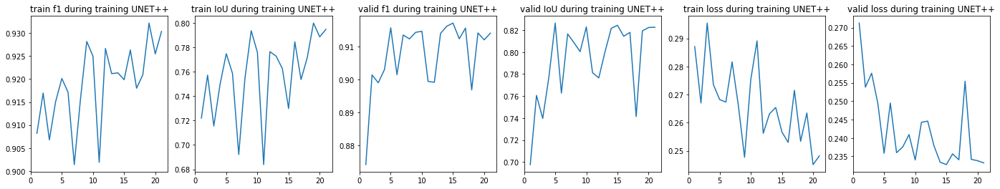

In [ ]:

fig, ax = plt.subplots(1,6, figsize=(24,4))
ax[0].plot(np.arange(1,len(tr_f1)+1),(tr_f1),label='f1 train')
ax[1].plot(np.arange(1,len(tr_iou)+1),(tr_iou),label='IoU train')
ax[0].set_title('train f1 during training UNET++')
ax[1].set_title('train IoU during training UNET++')
ax[2].plot(np.arange(1,len(val_f1)+1),(val_f1),label='f1 valid')
ax[3].plot(np.arange(1,len(val_iou)+1),(val_iou),label='IoU valid')
ax[2].set_title('valid f1 during training UNET++')
ax[3].set_title('valid IoU during training UNET++')
ax[4].plot(np.arange(1,len(tr_loss)+1),(tr_loss),label='train loss')
ax[5].plot(np.arange(1,len(val_loss)+1),(val_loss),label='valid loss')
ax[4].set_title('train loss during training UNET++')
ax[5].set_title('valid loss during training UNET++')
#plt.legend()
plt.show()

TRY MODEL ON VALIDATION SAMPLES

**TEST UNET ON VALIDATION 10 SCENES FROM SPARCS**

(tensor([0, 2]), tensor([41825,  8351])) (tensor([0, 2], device='cuda:0'), tensor([40716,  9460], device='cuda:0'))
(tensor([0, 2]), tensor([42200,  7976])) (tensor([0, 2], device='cuda:0'), tensor([42711,  7465], device='cuda:0'))
(tensor([0, 2]), tensor([41385,  8791])) (tensor([0, 2], device='cuda:0'), tensor([41700,  8476], device='cuda:0'))
(tensor([0, 2]), tensor([41099,  9077])) (tensor([0, 2], device='cuda:0'), tensor([41867,  8309], device='cuda:0'))
(tensor([0, 2]), tensor([18895, 31281])) (tensor([0, 2], device='cuda:0'), tensor([20394, 29782], device='cuda:0'))
(tensor([0, 1, 2]), tensor([16563,   654, 32959])) (tensor([0, 1, 2], device='cuda:0'), tensor([22197,   812, 27167], device='cuda:0'))
(tensor([0, 2]), tensor([35666, 14510])) (tensor([0, 2], device='cuda:0'), tensor([36681, 13495], device='cuda:0'))
(tensor([0, 2]), tensor([43529,  6647])) (tensor([0, 1, 2], device='cuda:0'), tensor([43138,    41,  6997], device='cuda:0'))
(tensor([0, 1, 2]), tensor([38329,    82, 

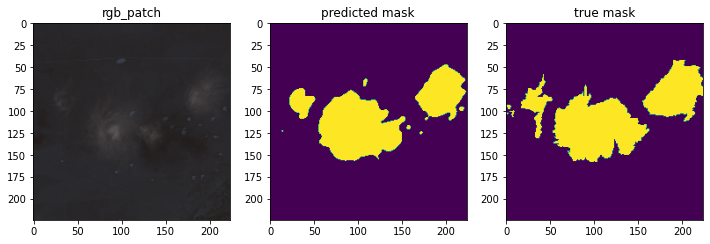

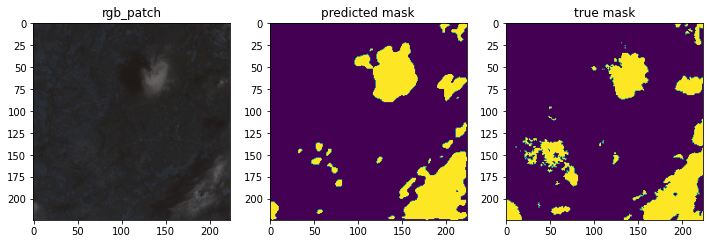

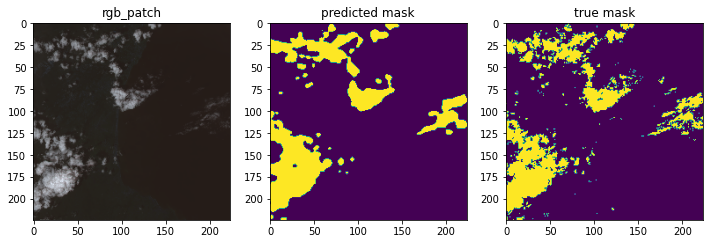

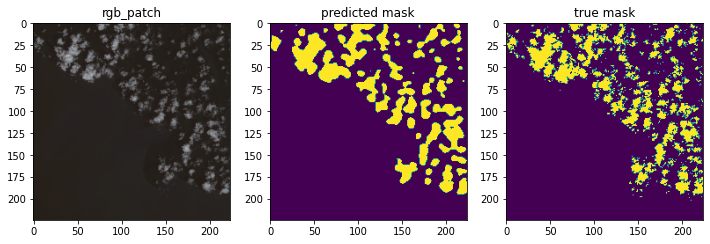

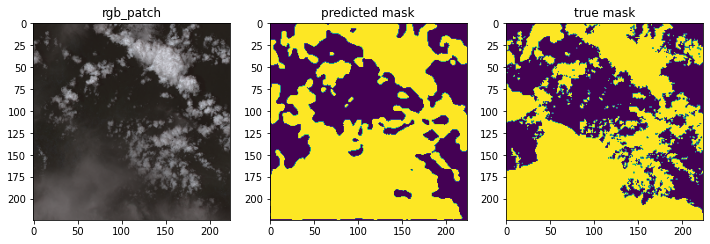

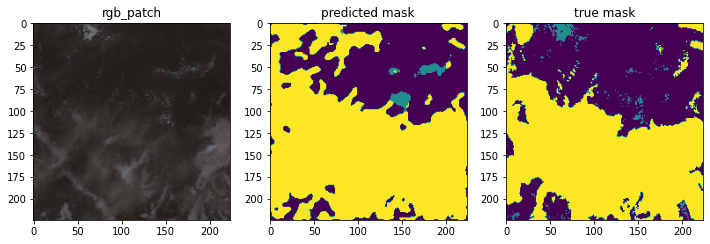

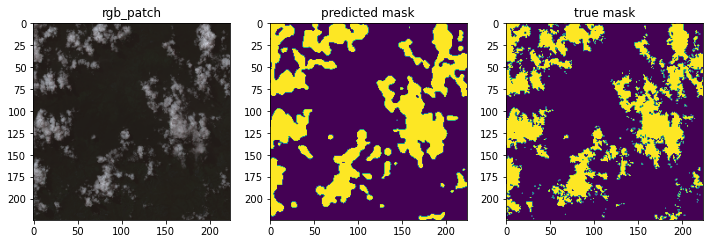

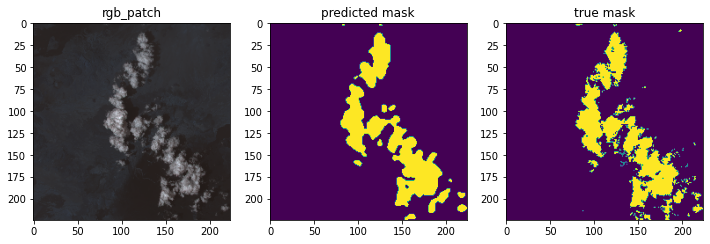

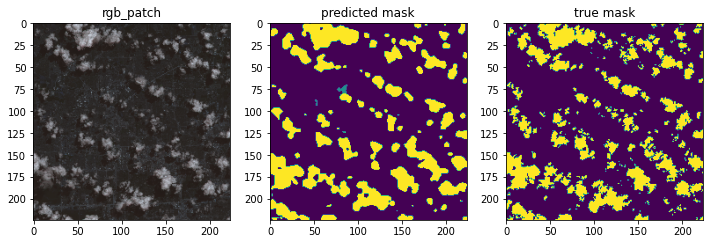

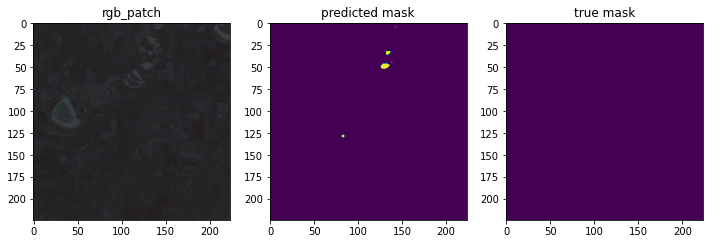

In [ ]:
def batch_to_img(xb, idx=0):
    img = np.array(xb.squeeze(0))
    #print(img.shape)
    return np.array(img.transpose((1,2,0))*255)
def transpose_patch(patch):
    tr = np.array(patch).astype(np.uint8).transpose((2,0,1))
    return tr
def predb_to_mask(predb,idx=0):
    #print(predb.shape)
    p = torch.functional.F.softmax(predb.squeeze(0), 0)
    #print('pred after softmax shape',p.shape)
    #print(p.size(),torch.sum(p))
    return p.argmax(0).cpu()
def inverse_normalize(tensor,mean,std,num_shannels =5):
    tensor = tensor.detach().cpu().numpy()

    # unnormalize the RGB channels
    for i in range(num_shannels):
        tensor[i] = (tensor[i] * std[i]) + mean[i]

    # clip values to [0, 1] range
    tensor = np.clip(tensor, 0, 1)

    # convert back to uint8
    tensor = (tensor * 255).astype(np.uint8)

    # swap channel positions to (height, width, channels)
    #tensor = np.transpose(tensor, (1, 2, 0))

    return tensor
#best_unet.eval()
model_path = '/content/drive/MyDrive/SPARCS/U-Net_efnet_b2_5_inputs_SPARCS_ep_24'
model.load_state_dict(torch.load(model_path))
model.cuda()
model.eval()
predictions,gt,pics =[],[],[]
#for i in range(len(Test_SPARCS_data)):
for x,x_rgb, y_ohe,y,mtl in valid_dl:
  for i in range(batch_size):
    xx_rgb = x_rgb[i]
    xx = x[i]
    yy = y[i]
    #print(yy.shape)
    #lonlat_i = lonlat[i]
    xx = xx.to(device)#.cuda()
    yy = yy.type(torch.LongTensor).to(device)#.cuda()
    #lonlat_i = lonlat_i.to(device)
    fig, ax = plt.subplots(1,3, figsize=(12,4))
    #test_xb,test_x_rgb, test_yb,test_meta = Test_SPARCS_data[test_idx]
    gt.append(yy)
    inv_xx = inverse_normalize(xx,mean, std)
    pics.append(inv_xx[0:3])
    cloud_masks = model(xx.unsqueeze(0))#
    predictions.append(predb_to_mask(cloud_masks))
    print(predictions[-1].unique(return_counts=True),gt[-1].unique(return_counts=True))
    #ax[0].imshow(batch_to_img(xx_rgb).astype('uint8'))#.astype(np.uint8)
    ax[0].imshow(pics[-1].transpose(1,2,0))
    #ax[0].imshow(Test_SPARCS_data.open_rgb_array(i))
    ax[1].imshow(predictions[-1].numpy())#predb_to_mask(cloud_masks).numpy().transpose(1,2,0).astype(np.uint8))
    #print(predb_to_mask(cloud_masks))
    ax[2].imshow(yy.cpu().numpy().astype(np.uint8))
    ax[0].set_title('rgb_patch')
    ax[1].set_title('predicted mask')
    ax[2].set_title('true mask')
  plt.show()

**LETS TRY TO EVALUATE GEOCOORDINATES (LON, LAT) FROM ELECTRO L1 IMAGE USING GDAL AND GPT SUPPORT)**

In [ ]:
input_jpg = "/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/131201_0930_1.jpg"
output_tif = "/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/131201_0930_1_.tif"
im = Image.open(input_jpg)

# convert the image to a numpy array
im_array = np.array(im)

# get the image dimensions
rows, cols, bands = im_array.shape

# define the projection and geotransform parameters
proj = '+proj=geos +h=35785831.0 +lon_0=0.0 +x_0=0.0 +y_0=0.0 +a=6378169.0 +b=6356583.8 +units=m +no_defs'
geotransform = (-5568750.000, 1000.0, 0.0, 5568750.000, 0.0, -1000.0)

# create the output GeoTIFF file using GDAL
driver = gdal.GetDriverByName('GTiff')
dataset = driver.Create(output_tif, cols, rows, bands, gdal.GDT_Byte)
dataset.SetGeoTransform(geotransform)
dataset.SetProjection(proj)

# write the array to the GeoTIFF file one band at a time
for i in range(bands):
    band = dataset.GetRasterBand(i+1)
    band.WriteArray(im_array[:, :, i])
    band.FlushCache()

In [ ]:
#!!!!ATTENTION!!!!###########################
#!!!!ATTENTION!!!!#############################THIS LOOP WORKS TOO LONG (MORE THAN 20 HOURS!!!!!!!!!!!)
#!!!!ATTENTION!!!!###########################
# open the GeoTIFF file using GDAL
dataset = gdal.Open(output_tif, gdal.GA_ReadOnly)

# get the metadata
metadata = dataset.GetMetadata()

# get the image dimensions
rows = dataset.RasterYSize
cols = dataset.RasterXSize
bands = dataset.RasterCount

# get the geotransform and projection
geotransform = dataset.GetGeoTransform()
proj = dataset.GetProjection()

# create 2D matrices for longitude and latitude
lon_matrix = np.zeros((rows, cols))
lat_matrix = np.zeros((rows, cols))

# loop through each pixel and get the longitude and latitude
for row in tqdm(range(rows)):
    for col in range(cols):
        # get the x, y coordinates of the pixel
        x = col * geotransform[1] + geotransform[0]
        y = row * geotransform[5] + geotransform[3]
        
        # create a point geometry using the x, y coordinates
        point = ogr.Geometry(ogr.wkbPoint)
        point.AddPoint(x, y)
        
        # create a coordinate transformation object
        src_srs = osr.SpatialReference()
        src_srs.ImportFromWkt(proj)
        tgt_srs = osr.SpatialReference()
        tgt_srs.ImportFromEPSG(4326)  # WGS84
        transform = osr.CoordinateTransformation(src_srs, tgt_srs)
        
        # transform the point to WGS84 coordinates
        point.Transform(transform)
        
        # get the longitude and latitude from the transformed point
        lon = point.GetX()
        lat = point.GetY()
        
        # save the longitude and latitude to the matrices
        lon_matrix[row, col] = lon
        lat_matrix[row, col] = lat
np.save("/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/131201_0930_1_lon.npy", lon_matrix)
np.save("/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/131201_0930_1_lat.npy", lat_matrix)
# print the longitude and latitude matrices
print('Longitude matrix:\n', lon_matrix)
print('Latitude matrix:\n', lat_matrix)

  2%|▏         | 210/11136 [22:53<19:51:25,  6.54s/it]


KeyboardInterrupt: ignored

In [ ]:
# Open the image file
##############ATTENTION!!!!!!PYPROJ IS NOT COMPATIBLE WITH GDAL!!!!!!!!!!!!!###################################
import pyproj
dataset = gdal.Open(output_tif, gdal.GA_ReadOnly)

# Get the image size and number of bands
cols = dataset.RasterXSize
rows = dataset.RasterYSize
num_bands = dataset.RasterCount

# Get the geotransform and projection information
geotransform = dataset.GetGeoTransform()
projection = dataset.GetProjection()

# Define the source and target projections
source_proj = pyproj.Proj(projection)
target_proj = pyproj.Proj(proj='latlong', datum='WGS84')

# Create a meshgrid of pixel coordinates
x_coords = np.linspace(0, cols-1, cols)
y_coords = np.linspace(0, rows-1, rows)
x_mesh, y_mesh = np.meshgrid(x_coords, y_coords)

# Calculate the longitude and latitude for each pixel
lon_matrix, lat_matrix = pyproj.transform(source_proj, target_proj, geotransform[0] + x_mesh * geotransform[1], geotransform[3] + y_mesh * geotransform[5])

# Print the shape of the longitude and latitude arrays
print(lon_matrix.shape)
print(lat_matrix.shape)
np.save("/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/131201_0930_lon_with_inf.npy", lon_matrix)
np.save("/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/131201_0930_lat_with_inf.npy", lat_matrix)
# print the longitude and latitude matrices
#print('Longitude matrix:\n', lon_matrix)
#print('Latitude matrix:\n', lat_matrix)

(11136, 11136)
(11136, 11136)


In [ ]:
np.unique(lon_matrix, return_counts=True), np.unique(lat_matrix, return_counts=True)

((array([-81.26501459, -81.25577836, -81.23434806, ...,  81.25297758,
          81.26185008,          inf]),
  array([       1,        1,        1, ...,        1,        1, 31458714])),
 (array([-81.18651509, -81.13993438, -81.10637   , ...,  81.19584965,
          81.23092008,          inf]),
  array([       1,        1,        1, ...,        1,        1, 31458714])))

In [ ]:
print( 'the ratio on notnan pixels with lon and lat coordinates (Earth coverage on img) is:',(11136**2-31458714)/(11136**2))

the ratio on notnan pixels with lon and lat coordinates (Earth coverage on img) is: 0.7463221661495492


In [ ]:
# Replace all inf values with NaN
lon_matrix[np.isinf(lon_matrix)] = np.nan
lat_matrix[np.isinf(lat_matrix)] = np.nan
# Get information about floating-point representation
finfo = np.finfo(lon_matrix.dtype)

# Set threshold based on maximum representable value
threshold = finfo.max / 10

# Replace all values greater than the threshold with NaN
lon_matrix[lon_matrix > threshold] = np.nan
lat_matrix[lat_matrix > threshold] = np.nan

# Find the minimum and maximum longitude and latitude values that are not NaN
min_lon = np.nanmin(lon_matrix)
max_lon = np.nanmax(lon_matrix)
min_lat = np.nanmin(lat_matrix)
max_lat = np.nanmax(lat_matrix)

print('Min longitude:', min_lon)
print('Max longitude:', max_lon)
print('Min latitude:', min_lat)
print('Max latitude:', max_lat)
np.save("/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/131201_0930_lon.npy", lon_matrix)
np.save("/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/131201_0930_lat.npy", lat_matrix)

Min longitude: -81.26501458803715
Max longitude: 81.2618500846346
Min latitude: -81.18651508973291
Max latitude: 81.23092008201193


**TRY TO DERIVE RGB channels from 2 ELECTRO L1 channels**

In [ ]:
from osgeo import gdal,osr, ogr
import numpy as np
import torch
from torchvision import transforms
from patchify import patchify, unpatchify
import cv2
from scipy.spatial import cKDTree
import matplotlib.pyplot as plt
from tqdm import tqdm

(11136, 11136, 3)


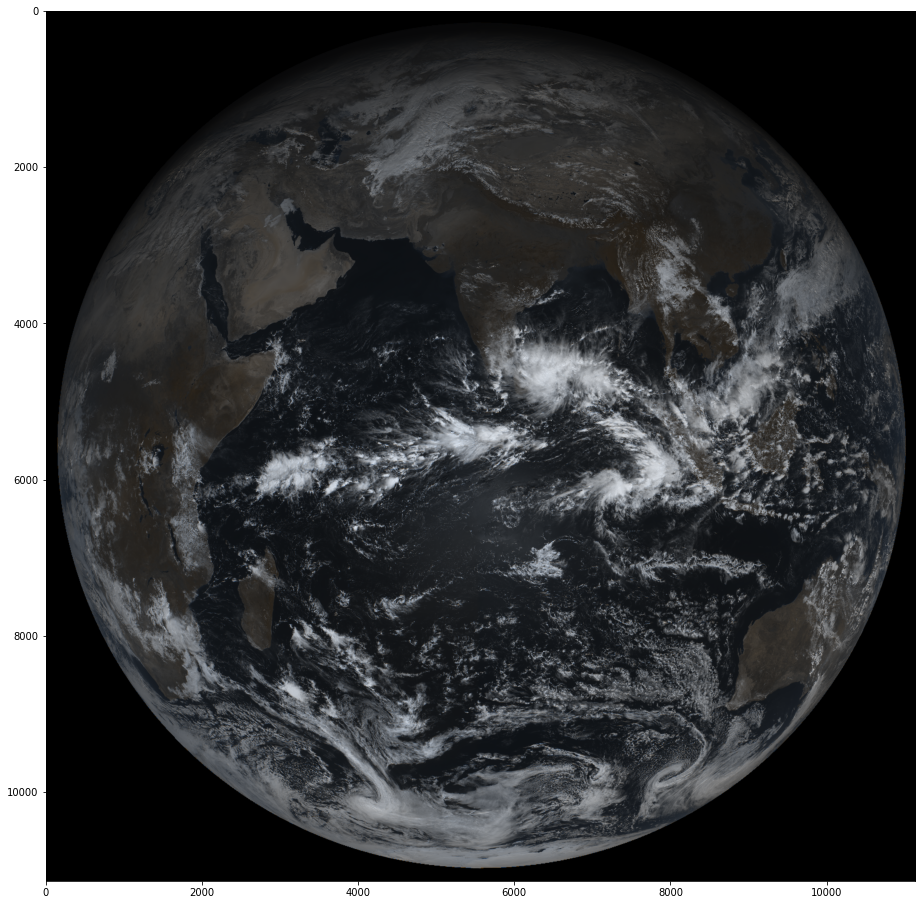

In [ ]:

# Open the two input channels as GDAL datasets
ch1 = "/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/131201_0930_1.jpg"
ch2 = "/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/131201_0930_2.jpg"
ds_band1 = gdal.Open(ch1)
ds_band2 = gdal.Open(ch2)

# Read the band data into numpy arrays
band1 = np.array(ds_band1.ReadAsArray(), dtype=np.uint8)[0]
band2 = np.array(ds_band2.ReadAsArray(), dtype=np.uint8)[0]
#print(band1.shape)
# Calculate the blue, green, and red channels from the input bands
blue = 1. * band1# - 0.2 * band2
green = 0.5 * band1 + 0.5 * band2
red = 0.1 * band1 + 0.9 * band2

# Create the RGB image by stacking the individual channels
rgb_to_save = np.dstack((blue, green, red)).astype(np.uint8)
rgb_to_show = np.dstack((red, green, blue)).astype(np.uint8)
print(rgb_to_save.shape)

# Write the RGB image to a new file
#TO SAVE IMAGE VIA CV2 PROPERLY USE np.dstack((blue, green, red))
#TO VISUALIZE IMAGE VIA CV2 PROPERLY USE np.dstack((red, green, blue))
rgb_name = "/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/131201_0930_rgb.jpg"
cv2.imwrite(rgb_name, rgb_to_save)
plt.figure(figsize=(16,16))
plt.imshow(rgb_to_show)#np.flip(rgb))
plt.show()

**LETS COMPARE THE RESULT WITH RGB+NIR PROVIDED VIA ELECTRO L1 3 channels**

mean and std of nir, 2nd and 1st cahnnels of ELECTRO img[0...255]: [38.30490368 39.34799878 42.58125574] [36.46213861 38.9818032  41.31288856]
mean and std of nir, 2nd and 1st cahnnels of ELECTRO array[0...1]: [0.15021531 0.15430588 0.16698532] [0.14298878 0.15286982 0.16201133]


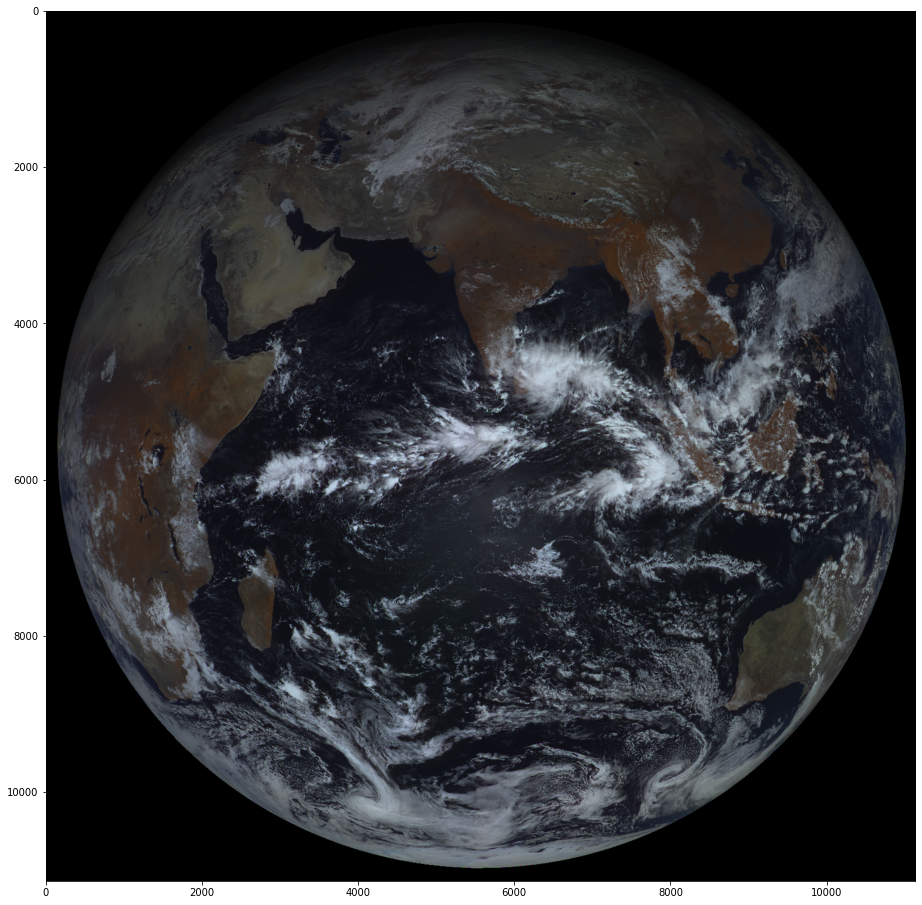

In [ ]:
ch1 = "/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/131201_0930_1.jpg"
ch2 = "/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/131201_0930_2.jpg"
nir_ch = "/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/131201_0930_3.jpg"
ds_band1 = gdal.Open(ch1)
ds_band2 = gdal.Open(ch2)
nir_raster = gdal.Open(nir_ch)
# Read the band data into numpy arrays
band1 = np.array(ds_band1.ReadAsArray(), dtype=np.uint8)[0]
band2 = np.array(ds_band2.ReadAsArray(), dtype=np.uint8)[0]
nir = np.array(nir_raster.ReadAsArray(), dtype=np.uint8)[0]
rgb_nir = np.dstack((nir, band2, band1))
means_int = np.mean(rgb_nir, axis=(0,1))
stds_int = np.std(rgb_nir, axis=(0,1))
means = np.mean(rgb_nir/255, axis=(0,1))
stds = np.std(rgb_nir/255, axis=(0,1))
print('mean and std of nir, 2nd and 1st channels of ELECTRO img[0...255]:',means_int,stds_int)
print('mean and std of nir, 2nd and 1st channels of ELECTRO array[0...1]:',means,stds)
plt.figure(figsize=(16,16))
plt.imshow(rgb_nir)
plt.show()

176
overlap should be 24.0
img_to_patch.shape =  (10976, 10976, 3)


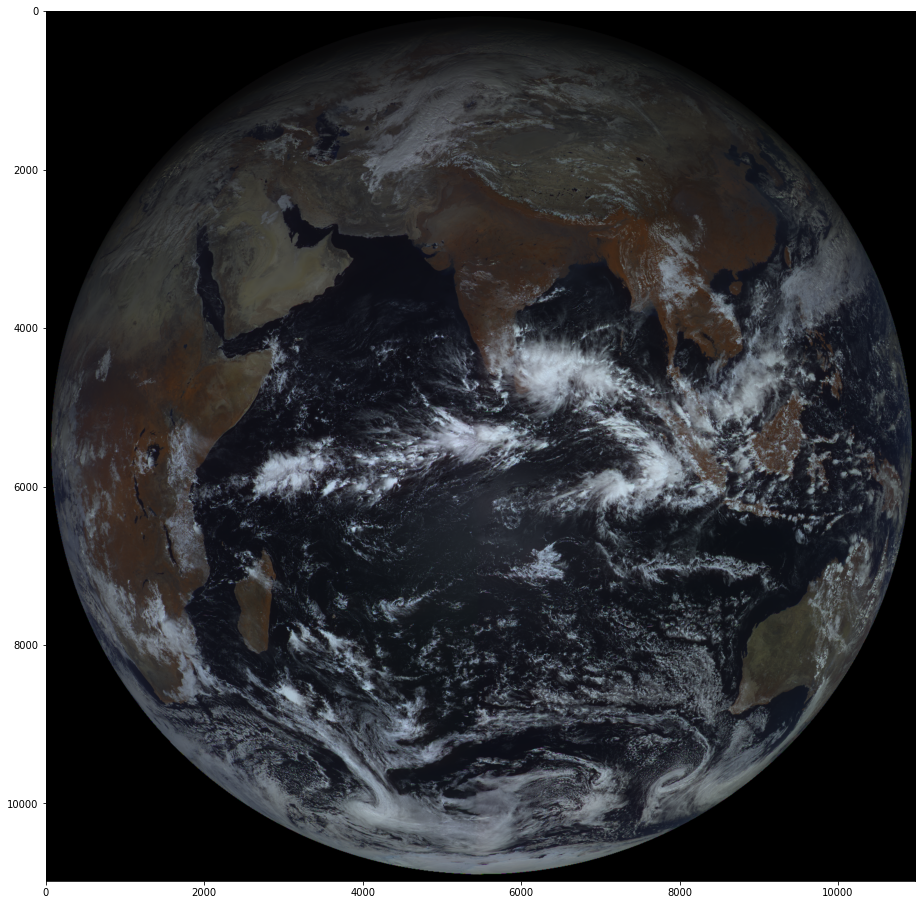

In [ ]:
# define the patchify step and overlap of pathes to work correctly
for i in range(168,224):
    if (11136-224)%i==0:print(i)
print('overlap should be',(224-176)/2)
11136-49*224
img_to_patch = rgb_nir[80:-80,80:-80,:]
print('img_to_patch.shape = ',img_to_patch.shape)
plt.figure(figsize=(16,16))
plt.imshow(img_to_patch)
plt.show()

In [ ]:
#!!!!ATTENTION!!!!#############################THIS LOOP WORKS LONG (about 30 minutes!!!!!!!!!!!)
lons= np.load("/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/131201_0930_lon_with_inf.npy")#.reshape(11136,11136,1)
lats = np.load("/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/131201_0930_lat_with_inf.npy")#.reshape(11136,11136,1)
# create example lon and lat matrices
n = 11136 #size of R,G,B and NIR channels of ELECTRO L1

# find indices of non-inf elements
rows, cols = np.nonzero(np.isfinite(lats))

# create arrays for filling with nearest non-inf values
nearest_lats = np.empty_like(lats)
nearest_lons = np.empty_like(lons)

# fill with nearest non-inf values
for i in tqdm(range(n)):
    mask = rows == i
    row_indices = cols[mask]
    if row_indices.size > 0:
        nearest_lats[i] = np.interp(np.arange(n), row_indices, lats[i, row_indices], left=np.nan, right=np.nan)
        nearest_lons[i] = np.interp(np.arange(n), row_indices, lons[i, row_indices], left=np.nan, right=np.nan)

# replace inf values with nearest non-inf values
lats[np.isinf(lats)] = nearest_lats[np.isinf(lats)]
lons[np.isinf(lons)] = nearest_lons[np.isinf(lons)]
lonlat = np.dstack((lons,lats))
print('lonlat.shape',lonlat.shape)
np.nansum(lonlat)

100%|██████████| 11136/11136 [30:34<00:00,  6.07it/s]


lonlat.shape (11136, 11136, 2)


1069.1452382058142

In [ ]:
#fill inf values via extrapolation
######!!!ATTENTION!!!!#############################THIS LOOP WORKS LONG (about 30 minutes!!!!!!!!!!!)
from scipy.interpolate import griddata
lon= np.load("/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/131201_0930_lon_with_inf.npy")#.reshape(11136,11136,1)#lat = np.load("/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/131201_0930_lat_with_inf.npy")#.reshape(11136,11136,1)
lat= np.load("/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/131201_0930_lat_with_inf.npy")
# Assuming lon and lat are numpy arrays with inf values
# Replace the inf values with NaNs
lon[lon == np.inf] = np.nan
lat[lat == np.inf] = np.nan

# Create a meshgrid of valid (non-NaN) values
xx, yy = np.meshgrid(np.arange(lon.shape[1]), np.arange(lon.shape[0]))
xx_valid = xx[~np.isnan(lon)]
yy_valid = yy[~np.isnan(lat)]
lon_valid = lon[~np.isnan(lon)]
lat_valid = lat[~np.isnan(lat)]

# Interpolate the NaN values using griddata
lon_interp = griddata((xx_valid, yy_valid), lon_valid, (xx, yy), method='nearest')
lat_interp = griddata((xx_valid, yy_valid), lat_valid, (xx, yy), method='nearest')

# Replace any remaining NaN values with a default value (e.g., -9999)
lon_interp[np.isnan(lon_interp)] = 0#-9999
lat_interp[np.isnan(lat_interp)] = 0#-9999
lonlat_interp = np.dstack((lon_interp,lat_interp))
np.nansum(lon_interp),np.nansum(lat_interp)

(-2130640.7844164283, 1788332.2676277226)

In [ ]:
print('unick values of lons:',np.unique(lon_interp,return_counts=True))
print('unick values of lats:',np.unique(lat_interp,return_counts=True))

unick values of lons: (array([-81.26501459, -81.25577836, -81.23434806, ...,  81.2110219 ,
        81.25297758,  81.26185008]), array([1594, 1732, 1655, ..., 1541, 1577, 1705]))
unick values of lats: (array([-81.18651509, -81.13993438, -81.10637   , ...,  81.18392238,
        81.19584965,  81.23092008]), array([1840, 1840,  152, ..., 1894, 1875, 1875]))


In [ ]:
#np.save('/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/lon_interp.npy', lon_interp)
#np.save('/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/lat_interp.npy', lat_interp)
#np.save('/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/lonlat_interp.npy', lonlat_interp)

In [ ]:
#THIS CODE INCLUDES LON and LAT with INTERPOLATED VALUES INSTEAD OF INF
lon = np.load("/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/lon_interp.npy")#.reshape(11136,11136,1)
lat = np.load("/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/lat_interp.npy")#.reshape(11136,11136,1)
lonlat = np.dstack((lon,lat))
print('lonlat.shape',lonlat.shape)
np.nansum(lonlat)

lonlat.shape (11136, 11136, 2)


-342308.5167995386

In [ ]:
#PATCHIFY with no overlapping via cv2 with ChatGPT assist)
import numpy as np
import os
from PIL import Image
print(rgb_nir.shape)
patch_size = 224
def split_image(image, patch_size,dir_name='/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/patches_spectrum/'):
    # Calculate the number of patches in each dimension
    image = image[80:-80,80:-80,:]
    n_patches_h = image.shape[0] // patch_size[0]
    n_patches_w = image.shape[0] // patch_size[1]
    print('n_patches_h,n_patches_w',n_patches_h,n_patches_w)
    # Check if the image can be evenly divided into patches
    assert image.shape[0] == n_patches_h * patch_size[0], f"Image height {image.shape[0]} is not divisible by patch height {patch_size[0]}"
    assert image.shape[1] == n_patches_w * patch_size[1], f"Image width {image.shape[1]} is not divisible by patch width {patch_size[1]}"

    # Split the image into non-overlapping patches
    patches = []
    for i in range(n_patches_h):
        for j in range(n_patches_w):
            patch = image[i * patch_size[0]:(i + 1) * patch_size[0], j * patch_size[1]:(j + 1) * patch_size[1]]
            patches.append(patch)
            result = Image.fromarray((patch).astype(np.uint8))
            patch_name= dir_name+'patch_'+str(n_patches_h*i+j)+'.jpg'
            result.save(patch_name)
    return np.array(patches)
    ############ THE SAME FUNCS FOR LONLAT ARRAYS##############################################
def split_lonlat_to_patches(matrix,patch_size, dir_name='/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/patches_lonlat/'):
    matrix = matrix[80:-80,80:-80,:]
    #assert matrix.shape[0] % patch_size == 0, "Patch size doesn't divide the matrix size!"
    #assert matrix.shape[1] % patch_size == 0, "Patch size doesn't divide the matrix size!"
    n_patches_h = matrix.shape[0] // patch_size[0]
    n_patches_w = matrix.shape[0] // patch_size[1]
    patches = []
    for i in range(n_patches_h):
        for j in range(n_patches_w):
            patch = matrix[i * patch_size[0]:(i + 1) * patch_size[0], j * patch_size[1]:(j + 1) * patch_size[1]]
            patches.append(patch)
            #result = Image.fromarray((patch).astype(np.uint8))
            patch_name= dir_name+'patch_'+str(n_patches_h*i+j)+'.npy'
            np.save(patch_name, patch)    
    return np.array(patches)
lonlat_parts = split_lonlat_to_patches(lonlat, (224, 224))
print(len(lonlat_parts))

(11136, 11136, 3)
2401


In [ ]:
# Works properly!
def merge_lonlat(patch_folder, patch_shape):
    # Calculate the dimensions of the merged matrix
    num_patches = int(np.sqrt(len(os.listdir(patch_folder))))
    merged_shape = (num_patches * patch_shape[0], num_patches * patch_shape[1], patch_shape[2])
    
    # Initialize the merged matrix
    merged_matrix = np.zeros(merged_shape, dtype=np.float32)
    
    # Loop through each patch and add it to the merged matrix
    for i in tqdm(range(num_patches)):
        for j in range(num_patches):
            patch_path = os.path.join(patch_folder, f"patch_{i*num_patches+j}.npy")
            patch = np.load(patch_path)
            merged_matrix[i*patch_shape[0]:(i+1)*patch_shape[0], j*patch_shape[1]:(j+1)*patch_shape[1], :] = patch 
    return merged_matrix
patch_folder = '/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/patches_lonlat/'
patch_shape = (224,224,2)
merged_lonlat = merge_lonlat(patch_folder, patch_shape)
print(merged_lonlat.shape)
assert(merged_lonlat == lonlat[80:-80,80:-80,:]).all()

(10976, 10976, 2)


AssertionError: ignored

100%|██████████| 2401/2401 [00:05<00:00, 416.10it/s]


merged_image.shape =  (10976, 10976, 3)


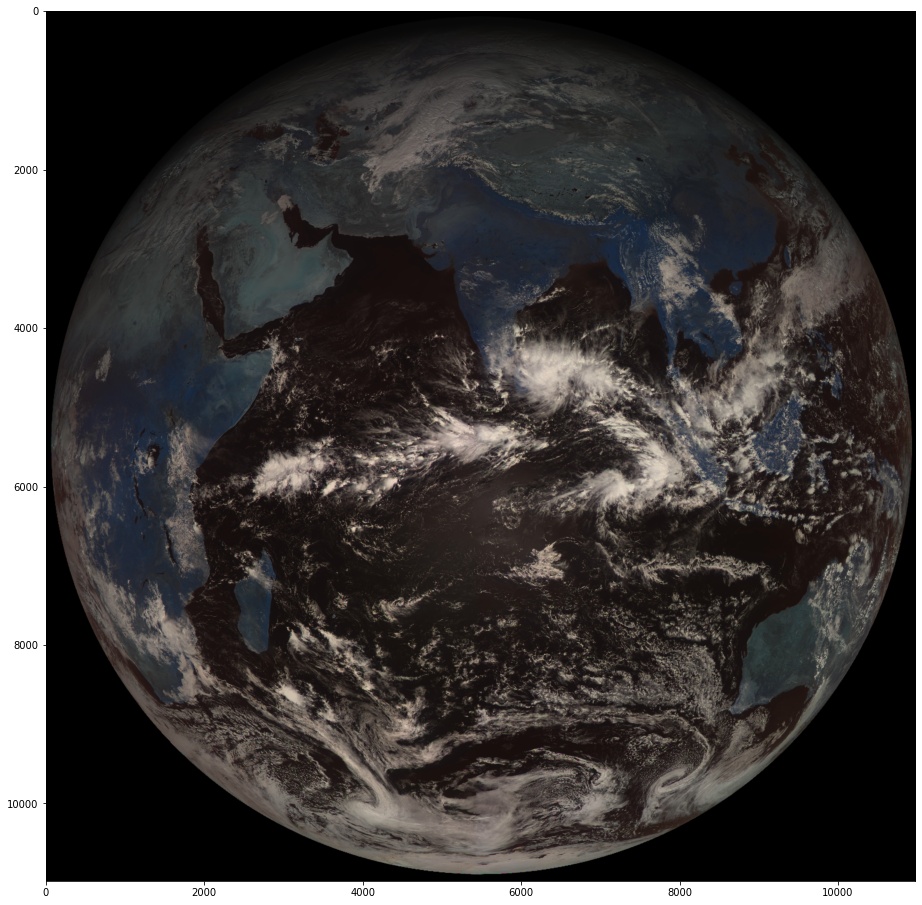

In [ ]:
# Works properly!
def merge_patches(patches_folder, output_file,output_shape):
    output_matrix = np.zeros(output_shape, dtype=np.uint8)
    
    # Loop through each patch and insert it into the output matrix
    for i in tqdm(range(2401)):
        patch_file = f"{patches_folder}/patch_{i}.jpg"
        patch_image = cv2.imread(patch_file)
        row = (i // 49) * 224
        col = (i % 49) * 224
        output_matrix[row:row+224, col:col+224, :] = patch_image
    
    # Save the output matrix to the specified file
    cv2.imwrite(output_file, output_matrix)
    return output_matrix
patch_folder = '/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/patches_spectrum'#Path('/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/patches_spectrum')
merged_im_file_name = '/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/merged_patches.jpg'
merged_shape = (10976, 10976, 3)
merged_image = merge_patches(patch_folder,output_file = merged_im_file_name,output_shape = merged_shape)
print('merged_image.shape = ',merged_image.shape)
plt.figure(figsize=(16,16))
plt.imshow(merged_image)
plt.show()

100%|██████████| 2401/2401 [19:15<00:00,  2.08it/s]


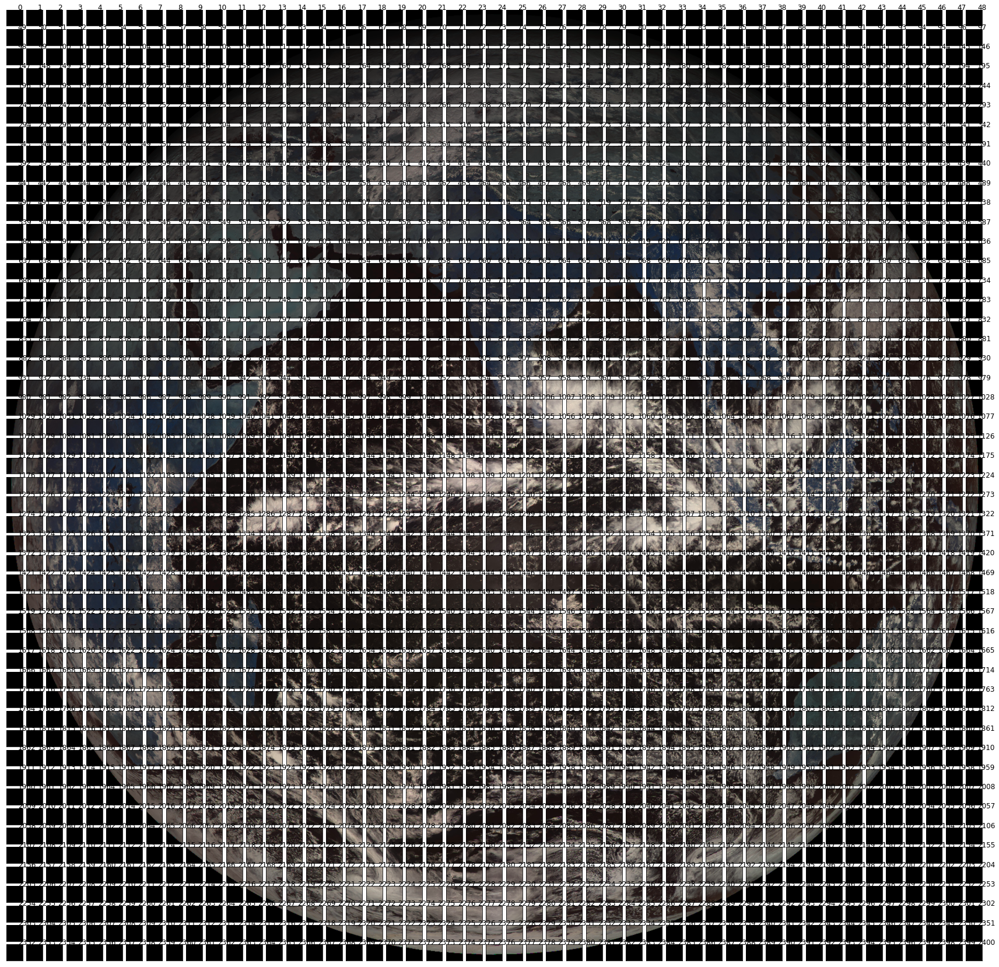

In [ ]:
transt = transforms.ToTensor()
transp = transforms.ToPILImage()
#ATTENTION!!!!!!! VISUALIZATION WORKS LONG!!! ABOUT 20 MINUTES
def visualize(patches_folder):
    fig = plt.figure(figsize=(30, 30))
    for i in tqdm(range(2401)):
        patch_file = f"{patches_folder}/patch_{i}.jpg"
        patch_image = cv2.imread(patch_file)
        #row = (i // 49) * 224
        #col = (i % 49) * 224
        ax = fig.add_subplot(49, 49, i+1, xticks=[], yticks=[])
        ax.text(160,0, str(i),fontsize =12)
        patch_to_show = np.dstack((patch_image[:,:,2], patch_image[:,:,1], patch_image[:,:,0])).astype(np.uint8)
        plt.imshow(patch_to_show)
patches_folder = '/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/patches_spectrum'
visualize(patches_folder)

**CREATE a DATASET class for ELECTRO patches**

In [ ]:
#mean and std of nir, 2nd and 1st channels of ELECTRO img[0...255]: [38.30490368 39.34799878 42.58125574] [36.46213861 38.9818032  41.31288856]
#mean and std of nir, 2nd and 1st channels of ELECTRO array[0...1]: [0.15021531 0.15430588 0.16698532] [0.14298878 0.15286982 0.16201133]
class ELECTRO_Dataset(Dataset):
    def __init__(self, rgb_dir, lonlat_dir,pytorch=True):
        super().__init__()
        self.rgb_dir = rgb_dir
        self.lonlat_dir = lonlat_dir
        self.pytorch = pytorch   
        self.step = 224
        self.mean = np.array([0.15021531, 0.15430588, 0.16698532])
        self.std = np.array([0.14298878, 0.15286982, 0.16201133])
        self.transforms = A.Compose([
        A.Normalize(mean=self.mean, std=self.std, max_pixel_value=1.0),
    ])        
    def __len__(self):
        num_patches = int((len(os.listdir(self.rgb_dir))))    
        return num_patches
    def open_as_array(self, idx, invert=False):
        patch_file = f"{self.rgb_dir}/patch_{idx}.jpg"
        patch_image = np.array(cv2.imread(patch_file))
        # if invert:
        #     patch_image = patch_image.transpose((2,0,1))
        img_normed  = (patch_image / np.iinfo(patch_image.dtype).max)
        return img_normed
    def open_lonlat(self, idx, invert=False):
        lonlat_file = f"{self.lonlat_dir}/patch_{idx}.npy"
        lonlat_arr = np.load(lonlat_file)
        lon,lat = lonlat_arr[:,:,0],lonlat_arr[:,:,1]#np.dstack((lons,lats))
        lon,lat = (lon+180.0)/360.0,(lat+90.0)/180.0
        lonlat_normed = np.dstack((lon,lat))
        # if invert:
        #     lonlat_normed = lonlat_normed.transpose((2,0,1))
        return lonlat_normed
    def __getitem__(self, idx):
        #x = torch.tensor(self.open_as_array( idx,invert=self.pytorch), dtype=torch.float32)#float32
        rgb = self.open_as_array( idx,invert=self.pytorch)
        transformed = self.transforms(image = rgb)
        rgb_normed = transformed['image']
        lonlat = self.open_lonlat( idx,invert=self.pytorch)
        x_rgb_lonlat = torch.cat([torch.tensor(rgb_normed, dtype=torch.float32),torch.tensor(lonlat, dtype=torch.float32)], dim =2).permute(2,0,1)
        return x_rgb_lonlat#,indeces
    
    def open_as_pil(self, idx):
        patch_file = f"{self.rgb_dir}/patch_{idx}.jpg"
        patch_image = cv2.imread(patch_file)
        patch_to_show = np.dstack((patch_image[:,:,2], patch_image[:,:,1], patch_image[:,:,0])).astype(np.uint8)
        return patch_to_show #Image.fromarray(arr.astype(np.uint8), 'RGB')   
    def __repr__(self):
        s = 'Dataset class with {} files'.format(self.__len__())
        return s


(torch.Size([5, 224, 224]), 2401)

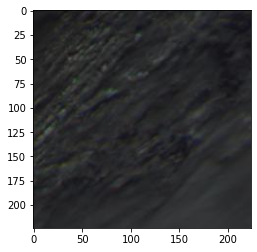

In [ ]:

from PIL import Image
rgb_dir = '/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/patches_spectrum'
lonlat_dir = '/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/patches_lonlat'
electro_data_0930 = ELECTRO_Dataset(rgb_dir = rgb_dir, lonlat_dir=lonlat_dir)
SAMPLE_INDX = 400
x_rgb_lonlat = electro_data_0930[SAMPLE_INDX]
plt.imshow(electro_data_0930.open_as_pil((SAMPLE_INDX)))#.transpose(1,2,0))
x_rgb_lonlat.shape ,len(electro_data_0930)

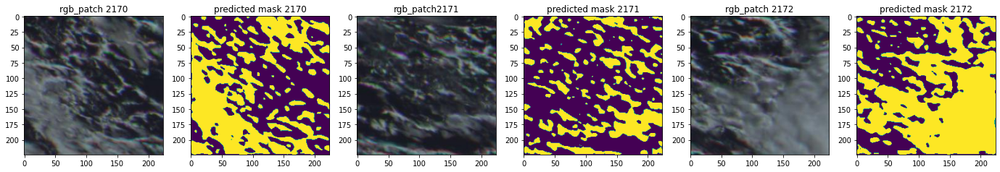

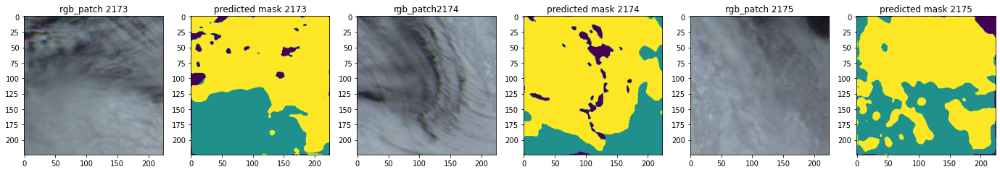

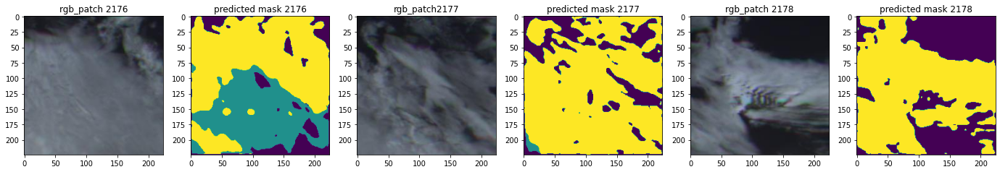

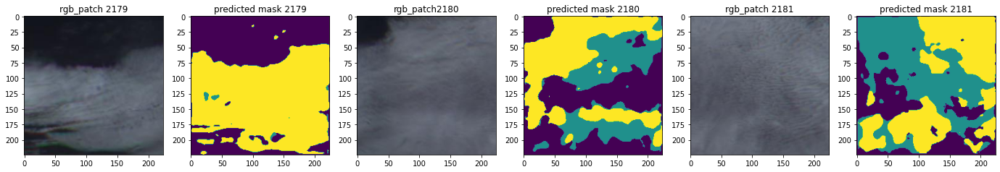

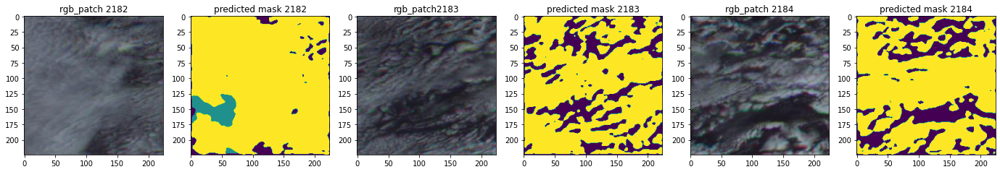

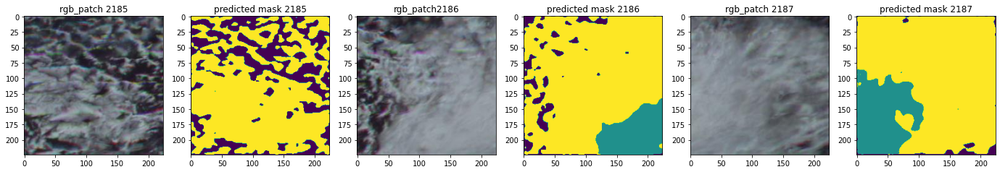

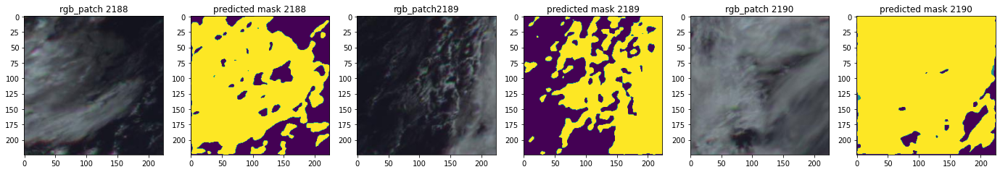

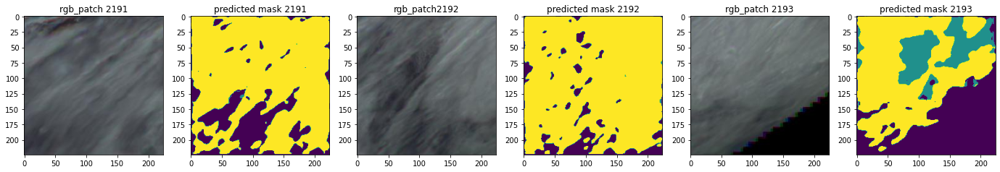

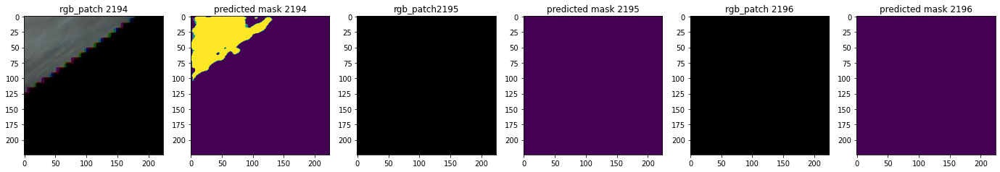

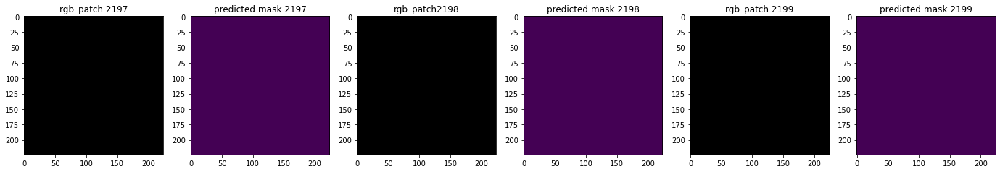

In [ ]:

#for i in range(len(Test_SPARCS_data)):

def visualize_triple_pred(idx, model = model,dataset = electro_data_0930):
  x_rgb_lonlat = dataset[idx].to(device)
  x_rgb_lonlat_next = dataset[idx+1].to(device)
  x_rgb_lonlat_last = dataset[idx+2].to(device)
  fig, ax = plt.subplots(1,6, figsize=(24,4))
  cloud_mask = model(x_rgb_lonlat.unsqueeze(0))#
  cloud_mask_next = model(x_rgb_lonlat_next.unsqueeze(0))
  cloud_mask_last = model(x_rgb_lonlat_last.unsqueeze(0))
  pred=predb_to_mask(cloud_mask).numpy()
  pred_next=predb_to_mask(cloud_mask_next).numpy()
  pred_last=predb_to_mask(cloud_mask_last).numpy()
  ax[0].imshow(dataset.open_as_pil(idx))
  ax[1].imshow(pred)
  ax[2].imshow(dataset.open_as_pil(idx+1))
  ax[3].imshow(pred_next)
  ax[4].imshow(dataset.open_as_pil(idx+2))
  ax[5].imshow(pred_last)
  ax[0].set_title('rgb_patch '+str(idx))
  ax[1].set_title('predicted mask '+str(idx))
  ax[2].set_title('rgb_patch'+str(idx+1))
  ax[3].set_title('predicted mask '+str(idx+1))
  ax[4].set_title('rgb_patch '+str(idx+2))
  ax[5].set_title('predicted mask '+str(idx+2))
  plt.show()
for idx in range(2170,2200,3):
  visualize_triple_pred(idx, model = model,dataset = electro_data_0930)

In [ ]:
def pred_and_save_masks(idx, model = model,dataset = electro_data_0930):
  x_rgb_lonlat = dataset[idx].to(device)
  cloud_mask = model(x_rgb_lonlat.unsqueeze(0))#
  pred=predb_to_mask(cloud_mask).numpy()
  cloud_mask,snow_mask = pred.copy(),pred.copy()#np.zeros( pred.shape),np.zeros( pred.shape)
  cloud_mask[cloud_mask!=2] = 0 
  cloud_mask = cloud_mask*255
  snow_mask[snow_mask!=1] = 0 
  snow_mask=snow_mask*255
  cloud_mask = cv2.normalize(cloud_mask, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
  snow_mask = cv2.normalize(snow_mask, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)
  pred_name_cloud = '/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/patches_predict_cloud/patch_'+str(idx)+'.jpg'
  pred_name_snow = '/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/patches_predict_snow/patch_'+str(idx)+'.jpg'
  #result = Image.fromarray(pred)#(pred*127).astype(np.uint8))
  cv2.imwrite(pred_name_cloud, cloud_mask)
  cv2.imwrite(pred_name_snow, snow_mask)
  #FULL PREDICT ON 1 ELECTRO IMG OF 2401 PATCHES  WORKS ABOUT 2 MINUTES
for idx in tqdm(range(0,2401)):
  pred_and_save_masks(idx=idx, model = model,dataset = electro_data_0930)

100%|██████████| 2401/2401 [02:07<00:00, 18.87it/s]


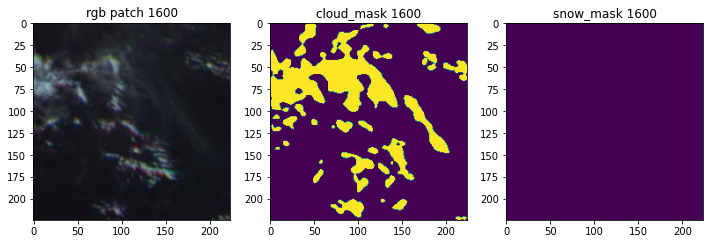

In [ ]:
def eval_mask(idx, model = model,dataset = electro_data_0930):
  x_rgb_lonlat = dataset[idx].to(device)
  cloud_mask = model(x_rgb_lonlat.unsqueeze(0))
  pred=predb_to_mask(cloud_mask).numpy()
  #print('pred shape and its unique values',pred.shape, np.unique(pred,return_counts=True))
  cloud_mask,snow_mask = pred.copy(),pred.copy()#np.zeros( pred.shape),np.zeros( pred.shape)
  cloud_mask[cloud_mask!=2] = 0 
  cloud_mask = cloud_mask*255
  snow_mask[snow_mask!=1] = 0 
  snow_mask=snow_mask*255
  return cloud_mask,snow_mask
idx =1600
cloud_mask,snow_mask = eval_mask(idx=idx, model = model,dataset = electro_data_0930)
fig, ax = plt.subplots(1,3, figsize=(12,4))
ax[0].imshow(electro_data_0930.open_as_pil(idx))
ax[1].imshow(cloud_mask)
ax[2].imshow(snow_mask)
ax[0].set_title('rgb patch '+str(idx))
ax[1].set_title('cloud_mask '+str(idx))
ax[2].set_title('snow_mask '+str(idx))
plt.show()

100%|██████████| 2401/2401 [00:04<00:00, 586.51it/s]


merged_mask.shape =  (10976, 10976)


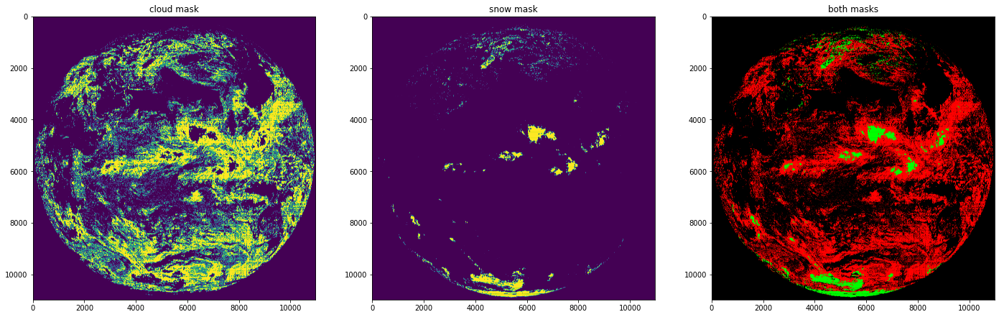

In [ ]:
def merge_masks(patches_folder, output_file,output_shape):
    output_matrix = np.zeros(output_shape, dtype=np.uint8)
    # Loop through each patch and insert it into the output matrix
    for i in tqdm(range(2401)):
        patch_file = f"{patches_folder}/patch_{i}.jpg"
        patch_image = cv2.imread(patch_file, cv2.IMREAD_GRAYSCALE)
        row = (i // 49) * 224
        col = (i % 49) * 224
        output_matrix[row:row+224, col:col+224] = patch_image
    
    # Save the output matrix to the specified file
    cv2.imwrite(output_file, output_matrix)
    return output_matrix
mask_folder_cloud = '/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/patches_predict_cloud'
merged_mask_file_name_cloud = '/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/merged_masks_cloud.jpg'
mask_folder_snow = '/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/patches_predict_snow'
merged_mask_file_name_snow = '/content/drive/MyDrive/ELECTRO_L1/1dec2013/09_30/merged_masks_snow.jpg'
merged_shape = (10976, 10976)
merged_mask_cloud = merge_masks(mask_folder_cloud,output_file = merged_mask_file_name_cloud,output_shape = merged_shape)
merged_mask_snow = merge_masks(mask_folder_snow,output_file = merged_mask_file_name_snow,output_shape = merged_shape)
print('merged_mask.shape = ',merged_mask_cloud.shape)
fig, ax = plt.subplots(1,3, figsize=(24,8))
ax[0].imshow(merged_mask_cloud)
ax[1].imshow(merged_mask_snow)
bg = np.zeros((10976, 10976), dtype=np.uint8)
ax[2].imshow(np.dstack((merged_mask_cloud,merged_mask_snow,bg)))
ax[0].set_title('cloud mask')
ax[1].set_title('snow mask')
ax[2].set_title('both masks')
plt.show()

**LETS TRY TO PARSE LEVIR_CS DATASET**

In [119]:
def maskToTensor(img):
    return torch.from_numpy(np.array(img,dtype=np.int32)).long().unsqueeze(0)
class LevirCS_MSS_CloudSnowDatasetV3(object):
    #image: mss 16 bit
    #label: 0,1 8 bit
    #SHOULD WE NORMALIZE OR STANDARTIZE IMAGE DATA???????
    def __init__(self,trainTxtPath='/content/drive/MyDrive/Levir_CS/train_levir_cloud_snow_dataset_version3_withdem.txt',rootPath='',
        joint_transform=None,image_transform=None,mean=[257.0/1024.0,268.0/1024.0,276.0/1024.0,238.0/1024.0], include_dem = False):
        #bands
        """
        image 4 bands  -> 0-1023 ->  0-1
        dem 1 band   -> /10000.0 -> almost 0-1
        geo 2 bands  -> 1st long -180-180 -> 0-1 ; 2nd lat -90 - 90 -> 0-1 
        time 1 band  -> 1.1-12.31  /365.0 or 366.0 ->  0-1
        """

        #only for train
        """
        mean_value: 257 #514
        mean_value: 268 #536
        mean_value: 276 #552
        mean_value: 238 #475
        """
        # self.type = type
        # self.demFlag = self.type/4
        # self.geoFlag = ((self.type%4)>1)*1
        # self.timeFlag = self.type%2 

        txtFile = open(trainTxtPath,'r')
        self.mean = np.array([257,268,276,238])
        self.std = np.array([1,1,1])
        self.imgPath=[]
        self.demPath=[]
        self.seglabelPath=[]
        self.include_dem = include_dem
        self.transforms = A.Compose([
        A.Resize(224, 224),
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
        #A.Normalize(mean=self.mean, std=self.std, max_pixel_value=1.0),
    ])
        # self.imgs=[]
        # self.dems=[]
        # self.geos=[]
        # self.times=[]
        # self.datacubes = []
        # self.seglabels = []

        print( "loading data paths......")
        while 1:
            line = txtFile.readline()
            if not line:
                break
            (imgPath_s,demPath_s,seglabelPath_s) = line.split()
            #print imgPath_s
            #print labelPath_s
            self.imgPath.append(rootPath+imgPath_s)
            self.demPath.append(rootPath+demPath_s)
            self.seglabelPath.append(rootPath+seglabelPath_s)
            
        print( "loading data paths finished......")
        # print len(self.img)
        # print len(self.seglabel)
        # print len(self.scenelabel)


        self.joint_transform = joint_transform
        self.image_transform = image_transform
        self.mean = mean

    def __getitem__(self,index):

        # img = self.imgs[index]
        imgPath_s = self.imgPath[index]
        demPath_s = self.demPath[index]
        seglabelPath_s = self.seglabelPath[index]
        #print('seglabelPath_s:',seglabelPath_s)
        imgDataset = gdal.Open(imgPath_s)
        imgGeotransform = imgDataset.GetGeoTransform()
        tmp = imgDataset.GetRasterBand(1).ReadAsArray()
        if self.include_dem:    
          datacube = np.zeros( (tmp.shape[0],tmp.shape[1],6) ).astype('uint16') 
          band1 = imgDataset.GetRasterBand(1).ReadAsArray()#/1023.0
          band2 = imgDataset.GetRasterBand(2).ReadAsArray()#/1023.0
          band3 = imgDataset.GetRasterBand(3).ReadAsArray()#/1023.0
          band4 = imgDataset.GetRasterBand(4).ReadAsArray()#/1023.0
          ch1 = 0.5*band1+0.5*band2
          datacube[:,:,0] = ch1.copy()
          datacube[:,:,1] = band3.copy()
          datacube[:,:,2] = band4.copy()
          #print('max vaue of bands',np.max(datacube.flatten()))
          datacube = datacube/np.iinfo(datacube.dtype).max
          #print('max vaue of bands',np.max(datacube.flatten()))
          datacube[:,:,3]= (imgGeotransform[0]+imgGeotransform[1]*np.tile(np.arange(tmp.shape[1]),(tmp.shape[0],1)) + imgGeotransform[2]*(  (np.ones( (tmp.shape[1],tmp.shape[0]) )*np.arange(tmp.shape[0])).transpose()     )  +180.0)/360.0
          datacube[:,:,4]= (imgGeotransform[3]+imgGeotransform[4]*np.tile(np.arange(tmp.shape[1]),(tmp.shape[0],1)) + imgGeotransform[5]*(  (np.ones( (tmp.shape[1],tmp.shape[0]) )*np.arange(tmp.shape[0])).transpose()     )  +90.0)/180.0
          # for i in range(0,4):
          #     datacube[:,:,i] = imgDataset.GetRasterBand(i+1).ReadAsArray()
          #     datacube[:,:,i] = (datacube[:,:,i]>1023)*1023 + (datacube[:,:,i]<=1023)*datacube[:,:,i]
          #     datacube[:,:,i] = datacube[:,:,i]/1023.0
          imgDataset=None
          datacube[:,:,i]
          demDataset = gdal.Open(demPath_s)

          datacube[:,:,5] = ( (demDataset.GetRasterBand(1).ReadAsArray()).astype('float32') ) /10000.0
          demDataset = None

          #datacube[:,:,5]= (imgGeotransform[0]+imgGeotransform[1]*np.tile(np.arange(tmp.shape[1]),(tmp.shape[0],1)) + imgGeotransform[2]*(  (np.ones( (tmp.shape[1],tmp.shape[0]) )*np.arange(tmp.shape[0])).transpose()     )  +180.0)/360.0
          #datacube[:,:,6]= (imgGeotransform[3]+imgGeotransform[4]*np.tile(np.arange(tmp.shape[1]),(tmp.shape[0],1)) + imgGeotransform[5]*(  (np.ones( (tmp.shape[1],tmp.shape[0]) )*np.arange(tmp.shape[0])).transpose()     )  +90.0)/180.0
        else:
          datacube = np.zeros( (tmp.shape[0],tmp.shape[1],5) ).astype('float32') 
          band1 = imgDataset.GetRasterBand(1).ReadAsArray()/1023.0
          band2 = imgDataset.GetRasterBand(2).ReadAsArray()/1023.0
          band3 = imgDataset.GetRasterBand(3).ReadAsArray()/1023.0
          band4 = imgDataset.GetRasterBand(4).ReadAsArray()/1023.0
          ch1 = 0.5*band1+0.5*band2
          datacube[:,:,0] = ch1.copy()#.astype('uint16') 
          datacube[:,:,1] = band3.copy()#.astype('uint16') 
          datacube[:,:,2] = band4.copy()#.astype('uint16') 
          #print('max vaue of bands',np.max(datacube.flatten()))
          #datacube = datacube/np.iinfo(datacube.dtype).max
          #print('max vaue of bands',np.max(datacube.flatten()))
          datacube[:,:,3]= (imgGeotransform[0]+imgGeotransform[1]*np.tile(np.arange(tmp.shape[1]),(tmp.shape[0],1)) + imgGeotransform[2]*(  (np.ones( (tmp.shape[1],tmp.shape[0]) )*np.arange(tmp.shape[0])).transpose()     )  +180.0)/360.0
          datacube[:,:,4]= (imgGeotransform[3]+imgGeotransform[4]*np.tile(np.arange(tmp.shape[1]),(tmp.shape[0],1)) + imgGeotransform[5]*(  (np.ones( (tmp.shape[1],tmp.shape[0]) )*np.arange(tmp.shape[0])).transpose()     )  +90.0)/180.0


        seglabel = (np.array(cv2.imread(seglabelPath_s,0))//127.0).astype('uint8') 
        #print('seglabel.shape =',seglabel.shape)
        augmented = self.transforms(image=datacube, mask=seglabel)#, lon_arr=lon_arr, lat_arr=lat_arr)
        datacube, seglabel = augmented['image'],augmented['mask']
        datacube = torch.tensor(datacube.transpose(2,0,1),dtype=torch.float32)
        seglabel = maskToTensor(seglabel)
        return datacube,seglabel
    def __len__(self):
        return len(self.seglabelPath)

In [120]:
Levir_CS_Dataset = LevirCS_MSS_CloudSnowDatasetV3()
len(Levir_CS_Dataset)#,Levir_CS_Dataset[0].shape

loading data paths......
loading data paths finished......


3068

In [125]:
idx = 1041
datacube, seglabel = Levir_CS_Dataset[idx]
datacube.shape, seglabel.shape,np.unique(seglabel.numpy(),return_counts = True)

(torch.Size([5, 224, 224]),
 torch.Size([1, 224, 224]),
 (array([0, 1, 2]), array([12643, 32101,  5432])))

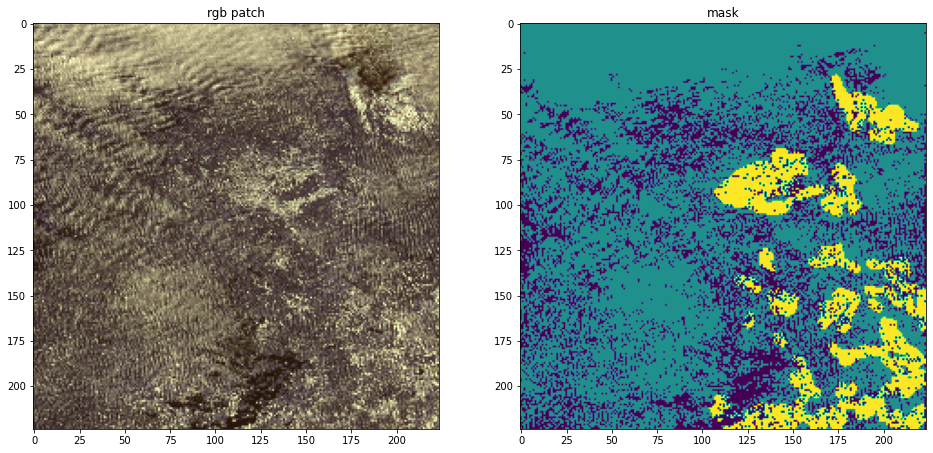

In [126]:
#LABELS: 0 - bg, 1 - SNOW, 2  - CLOUDS
def open_sample_as_pil(datacube):
  rgb = np.dstack((datacube[0,:,:].numpy(),datacube[1,:,:].numpy(),datacube[2,:,:].numpy()))
  #rgb = (255*(datacube[0:3,:,:].numpy().transpose(1,2,0))).astype(np.uint8)
  return rgb
def open_mask_as_pil(seglabel):
  mask = (seglabel.squeeze(0).numpy())#.astype(np.uint8)
  return mask
fig, ax = plt.subplots(1,2, figsize=(16,8))

ax[0].imshow(open_sample_as_pil(datacube))
ax[1].imshow(open_mask_as_pil(seglabel))
ax[0].set_title('rgb patch')
ax[1].set_title('mask')
plt.show()